# IDS Assignment Part 2 - <font color="red"><h7>Deadline: 23/01/2023 23:59</h7></font>
This is the second part of the assignment in IDS 2022/2023. 
Please use this Jupyter notebook to work on the questions posed in the assignment. When you are done, upload the notebook in Moodle at the designated activity. In addition to the _Jupyter notebook_, please submit _one zip-file_ containing your screenshots for Question 7. 

Give your commented Python code and answers in the corresponding provided cells. Make sure to answer all questions in a clear and explicit manner and discuss your outputs. _Please do not change the general structure of this notebook_. You can, however, add additional markdown or code cells if necessary. <b>Please DO NOT CLEAR THE OUTPUT of the notebook you are submitting! </b>

<font color="red"> *Please make sure to include the names and matriculation numbers of all group members in the slot provided below.* </font> If a name or a student id is missing, the student will not receive any points.

Hint 1: While working on the assignment, you will get a better understanding of the dataset. Feel free to generate additional results and visualizations to support your answers. For example, this might be useful regarding data modification, data simplification, or output interpretation. <font color="red">Ensure that all your claims are supported.</font>

Hint 2: <font color="red">Plan your time wisely. </font> A few parts of this assignment may take some time to run. It might be necessary to consider time management when you plan your group work. Also, do not attempt to upload your assignment at the last minute before the deadline. This often does not work, and you will miss the deadline. Late submissions will not be considered.

Hint 3: RWTHmoodle allows multiple submissions, with every new submission overwriting the previous one. <b>Partial submissions are therefore possible and encouraged. </b> This might be helpful in case of technical issues with RWTHMoodle, which may occur close to the deadline.

<font color="red"><b>Student Names and IDs:
    
    1. 
    
    2. 
    
    3.

## Question 1: Preprocessing (20 points)

In [1]:
import pandas as pd
import numpy as np

### Sklearn
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.impute import KNNImputer

from IPython.display import display

In this question, we consider a dataset documenting the Ski Resorts in Europe (**ski_resorts.csv**).
Each row contains some information about the Ski resort.
You can find a short description for each column:

| Column | Description |
| ------ | ----------- |
| Resort | The name of the ski & snowboard resort. |
| Country | The country in which the resort is located. |
| HighestPoint | The highest mountain point at the ski resort.   |
| LowestPoint | The lowest possible point to ski at the ski resort.  |
| DayPassPriceAdult | The price shows what it costs for 1 adult for 1 day in the main season in Euro. |
| BeginnerSlope | The total amount of “beginner” slopes in kilometer at the resort. “Beginner slopes” contains “children”, “blue” and, “green” slopes. |
| IntermediateSlope | The total amount of “intermediate” slopes in kilometer at the resort. “Intermediate slopes” contains “red” slopes. |
| DifficultSlope | The total amount of “difficult” slopes in kilometer at the resort. “Difficult slopes” contains “black”, “advanced”, and ”expert” slopes. |
| TotalSlope | The sum of “beginner slopes” + “intermediate slopes” + “difficult slopes” |
| Snowparks | Does the resort have one or more snowparks, or not? |
| NightSki | Does the resort offer skiing on illuminated slopes? |
| SurfaceLifts | The amount of lifts in this category: T-bar, Sunkidslift, Rope lifts, and people mower. |
| ChairLifts | The total amount of chairlifts. |
| GondolaLifts | The amount of lifts in this category: Gondola, Train lifts, Funicular, Combined gondola and chairlifts, Helicopter lifts, Snowcats, and Aerial tramways. |
| TotalLifts | The sum of “surface lifts etc” + “gondola etc” + “chairlifts etc.” |
| LiftCapacity | How many passengers can the lift system at the ski resort mowe in one hour? |
| SnowCannons  |The total amount of snow cannons at the ski resort.|

### a) Loading the Data and Initial Quality Investigation (2.5pts)

#### **a(i)** 
Load the dataset into a dataframe `df`. <font color='red'>Use the first column as index for your dataframe</font>. Ensure that the index is valid, that is, it should not contain any duplicate entries. 



**In the subsequent questions, only modify the dataframe `df` if explicitly requested. However, you can always create working copies.**

In [2]:
# your code
df = pd.read_csv('./datasets/ski_resorts.csv')

# Check if there is any duplicated value in the first column
duplicated = df.duplicated(subset=df.columns[0]).any()
print(f"Duplicated Values: {duplicated}")

Duplicated Values: False


#### **a(ii)** 
Show the data types of the dataframe columns as well as the first 5 rows. On the first sight, are there any data type problems (e.g., numerical columns having a non-numerical data type)?



In [3]:
# your code
print(df.dtypes)
display(df.head())

Unnamed: 0             int64
Resort                object
Country               object
HighestPoint         float64
LowestPoint          float64
DayPassPriceAdult    float64
BeginnerSlope        float64
IntermediateSlope      int64
DifficultSlope       float64
TotalSlope             int64
Snowparks             object
NightSki              object
SurfaceLifts         float64
ChairLifts             int64
GondolaLifts         float64
TotalLifts             int64
LiftCapacity         float64
SnowCannons          float64
dtype: object


,Unnamed: 0,Resort,Country,HighestPoint,LowestPoint,DayPassPriceAdult,BeginnerSlope,IntermediateSlope,DifficultSlope,TotalSlope,Snowparks,NightSki,SurfaceLifts,ChairLifts,GondolaLifts,TotalLifts,LiftCapacity,SnowCannons
0,1,Alpendorf (Ski amedé),Austria,1980.0,740.0,52.0,30.0,81,4.0,115,Yes,No,22.0,16,11.0,49,75398.0,600.0
1,2,Soldeu-Pas de la Casa/​Grau Roig/​El Tarter/​C...,Andorra,2640.0,1710.0,47.0,100.0,77,33.0,210,Yes,Yes,37.0,28,7.0,72,99017.0,1032.0
2,3,Oberau (Wildschönau),Austria,1130.0,900.0,30.0,1.0,0,1.0,2,No,No,2.0,0,0.0,2,1932.0,0.0
3,4,Dachstein West,Austria,1620.0,780.0,42.0,15.0,33,3.0,51,Yes,Yes,25.0,8,3.0,36,32938.0,163.0
4,5,Rosa Khutor,Southern Russia,2320.0,940.0,22.0,30.0,26,21.0,77,Yes,No,6.0,11,10.0,27,49228.0,450.0


**Your Answer:**

For the first part **a(i)**, there exists **no duplicates** among the index values.

For the second part **a(ii)**, we see **no discrepancy** between the column types and their values shown above on the first sight.

#### **a(iii)** 
To improve performance and memory usage (in particular for large datasets) it is important to use **categorical** columns whenever suitable.
Are there any categorical column candidates? Explain your answer. \
Afterward, convert the column(s) in `df` into categorical column(s).

In [4]:
# your code

# Find the columns which can be considered categorical
categorical_candidates = df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_candidates.remove('Resort')
# We exclude 'Resort' based on our observations explained below
for candidate in categorical_candidates:
    df[candidate] = df[candidate].astype('category')
    # Display the number of unique values for the candidate columns
    print(f"Number of unique values for the column '{candidate}': {len(df[candidate].unique())}")
    """
    Alternatively, we can use pd.Categorical as below
    """
    # df[candidate] = pd.Categorical(df[candidate])

categorical_columns = ['Country']
display(df.dtypes)

Number of unique values for the column 'Country': 27
Number of unique values for the column 'Snowparks': 2
Number of unique values for the column 'NightSki': 2


Unnamed: 0              int64
Resort                 object
Country              category
HighestPoint          float64
LowestPoint           float64
DayPassPriceAdult     float64
BeginnerSlope         float64
IntermediateSlope       int64
DifficultSlope        float64
TotalSlope              int64
Snowparks            category
NightSki             category
SurfaceLifts          float64
ChairLifts              int64
GondolaLifts          float64
TotalLifts              int64
LiftCapacity          float64
SnowCannons           float64
dtype: object

**Your Answer:**

First, we try to find the columns which can be considered cateogrical by inspecting their types. In order to correctly distinguish the categorical columns, we should first consider the definition of a categorical feature. A categorical variable takes on a limited, and usually fixed number of possible value. Examples are gender, social class, blood type, country affiliation, etc. In our case, the numeric features are not good candidates of categorical features, because they can take any value and cannot be represented by a fixed number of categories. (Note that the first column, which is the index column could somehow be categorical due to its boundedness; however, we do not consider it as a main feature in our dataset.)Therefore, we consider the other features marked as *object*:

- **Resort**: Although this feature looks like a a categorical one, it's not really suitable to consider it categorical because it could take any value, i.e. any type of ski resort.
- **Country**: The values representing this column are limited; therefore, we can consider it as a good candidate to be categorical.
- **Showparks**: The values representing this column are limited (Here, it's 'Yes' or 'No'); therefore, it can be considered as a categorical column.
- **NightSki**: (Same as *Showparks*) The values representing this column are limited (Here, it's 'Yes' or 'No'); therefore, it can be considered as a categorical column.

### Considerations / Inquiries:
1. Should we consider resort as categorical?
2. Ask also about index value

### b) Handling Missing Values & Encoding (17.5pts)

In the following task, you can assume that every NAN entry in the dataframe is actually a missing value. This can partially be justified by the fact that pandas did not have problems inferring the "proper" datatypes (e.g., a string indicating a missing number in a number column would result in pandas parsing an object column) and your subsequent check of the data types. Therefore, you can use `df.isna()` as a proxy indicator for missing values.

#### **b(i)** 
Simply discarding missing entries is usually not a good idea. Therefore, you should first analyze the number of missing values and check for patterns of missing values. 

To this end, compute the following statistics on missing values:
1. How many entries does the dataframe have? (To relate this to the number of entries missing)
2. How many missing values do we have? What is the ratio i.e., "number of missing values"/"number of entries of df"?
3. How many rows have at least a single missing value?
4. Count the number of missing values per column.
5. Count the number of missing values per row and aggregate them - i.e., show the number of rows that suffer from x missing values.
6. What do you observe? Are there any rows containing missing values for the same set of columns? Can you identify potential patterns?


In [5]:
# your code for 1. How many entries does the dataframe have? (To relate this to the number of entries missing)

# Note that count considers only non-null values (Check if we should count all entries)
entries_count = df.count().sum()
print(f"Number of entries in the dataframe: {entries_count}")

Number of entries in the dataframe: 6681


In [6]:
# your code for 2. How many missing values do we have? What is the ratio i.e., "number of missing values"/"number of entries of df"?
missing_values_count = df.isna().sum().sum()
ratio = missing_values_count / entries_count
print(f"Number of missing values: {missing_values_count}")
print(f"Ratio (number of missing values/number of entries of df): {ratio}")

Number of missing values: 87
Ratio (number of missing values/number of entries of df): 0.013022002694207453


In [7]:
# your code for 3. How many rows have at least a single missing value?
missing_rows_count = df.isna().any(axis = 1).sum()
print(f"Rows with at least one missing value: {missing_rows_count}")

Rows with at least one missing value: 45


In [8]:
# your code for 4. Count the number of missing values per column.
missing_values_per_column = df.isna().sum()
print(missing_values_per_column)

Unnamed: 0            0
Resort                0
Country               0
HighestPoint         13
LowestPoint           3
DayPassPriceAdult    17
BeginnerSlope         8
IntermediateSlope     0
DifficultSlope        8
TotalSlope            0
Snowparks             0
NightSki              0
SurfaceLifts          6
ChairLifts            0
GondolaLifts          7
TotalLifts            0
LiftCapacity         17
SnowCannons           8
dtype: int64


In [9]:
# your code for 5. Count the number of missing values per row and aggregate them - i.e., show the number of rows that suffer from x missing values.
rows_with_missing_values = df[df.isna().any(axis=1)]
missing_values_per_row = rows_with_missing_values.isna().sum(axis = 1)
print(f"Number of missing values per row: \n {missing_values_per_row}")
display(rows_with_missing_values)

Number of missing values per row: 
 9      1
18     1
22     1
49     1
75     1
78     1
91     1
104    1
116    1
118    2
121    1
122    1
125    1
150    1
171    1
186    1
188    1
200    1
203    2
207    1
216    6
217    6
218    6
219    6
220    6
221    6
222    6
228    1
237    1
241    1
242    1
246    1
249    1
250    1
259    1
266    1
267    1
274    1
292    1
297    1
306    1
334    1
341    6
342    1
371    1
dtype: int64


,Unnamed: 0,Resort,Country,HighestPoint,LowestPoint,DayPassPriceAdult,BeginnerSlope,IntermediateSlope,DifficultSlope,TotalSlope,Snowparks,NightSki,SurfaceLifts,ChairLifts,GondolaLifts,TotalLifts,LiftCapacity,SnowCannons
9,10,Kobla-Bohinj,Slovenia,1480.0,540.0,NaN,12.0,10,1.0,23,No,No,3.0,3,0.0,6,5720.0,30.0
18,19,Le Grand Massif-Flaine-​Les Carroz-​Morillon-​...,France,NaN,694.0,47.0,135.0,95,35.0,265,Yes,No,34.0,29,9.0,72,97624.0,1100.0
22,23,Kicking Horse,France,1608.0,1500.0,39.0,56.0,93,30.0,180,Yes,No,NaN,13,4.0,38,40680.0,281.0
49,50,Valberg-​Beuil les Launes,France,2020.0,1412.0,32.0,45.0,35,10.0,90,Yes,No,NaN,7,0.0,29,25940.0,400.0
75,76,Flumserberg,Switzerland,665.0,425.0,51.0,10.0,38,17.0,65,Yes,Yes,9.0,8,4.0,21,NaN,0.0
78,79,La Norma,France,2750.0,1350.0,29.0,17.0,43,5.0,65,Yes,No,7.0,5,1.0,13,NaN,126.0
91,92,Les Karellis,France,2520.0,1600.0,NaN,26.0,25,9.0,60,Yes,No,10.0,6,0.0,16,17452.0,98.0
104,105,Lauchernalp-Lötschental,Switzerland,3111.0,1419.0,48.0,20.0,17,18.0,55,Yes,No,2.0,2,NaN,6,6800.0,28.0
116,117,Pila,Italy,1540.0,570.0,NaN,8.0,35,6.0,50,Yes,No,5.0,8,4.0,17,22154.0,480.0
118,119,Aprica,Italy,2270.0,1162.0,38.0,28.0,14,7.0,50,Yes,No,NaN,4,2.0,16,NaN,0.0


**Your answer:** *(for 6. What do you observe? Are there any rows containing missing values for the same set of columns?)*

There are certain sets of columns which contain missing values for a set of rows, for instance, we can clearly observe that the values for the columns **Highest point**, **DayPassPriceAdult**, **BeginnerSlope**, **DifficultSlope**, **LiftCapacity** are missing for a number of rows in the middle (with the indices from 217 to 222). Based on this observation and the columns which contain missing values presented before, we can find that certain columns are likely to have more missing values and some rows contain the same set of columns with missing values.

#### **b(ii)**
For the next step:

1. Transform the categorical column(s) you identified in a(iii) into one-hot encoding format. 
2. Transform the columns "Snowparks" and "NightSki" in `df` into boolean data type, where "Yes" should be `True` and "No" should be `False`

In the end, the original categorical column(s) should still be there. Additionally, there should be x number (x is the number of unique values) of one-hot encoding columns for each categorical column. Use the following naming convention for the new columns "{name of the categorical column}_{unique value for that column}" Also, make sure the columns "Snowparks" and "NightSki" are boolean type in the end.
Lastly, print the top five rows of the resulting dataframe.

*Hint: You can use the pd.get_dummies() function from pandas for the first transformation*

### Considerations / Inquiries

1. Make sure which columns to encode

In [10]:
# your code for 1. Transform the categorical column(s) you identified in a(iii) into one-hot encoding format. 
encoded_df = pd.get_dummies(df[categorical_columns])
df = pd.concat([df, encoded_df], axis=1)

In [11]:
# your code for 2. Transform the columns "Snowparks" and "NightSki" in `df` into boolean data type, where "Yes" should be `True` and "No" should be `False`
boolean_map = {'Yes': True, 'No': False}
df['Snowparks'].replace(boolean_map, inplace = True)
df['NightSki'].replace(boolean_map, inplace = True)
df['Snowparks'] = df['Snowparks'].astype('bool')
df['NightSki'] = df['NightSki'].astype('bool')

display(df.head())

,Unnamed: 0,Resort,Country,HighestPoint,LowestPoint,DayPassPriceAdult,BeginnerSlope,IntermediateSlope,DifficultSlope,TotalSlope,...,Country_Serbia,Country_Siberia,Country_Slovakia,Country_Slovenia,Country_Southern Russia,Country_Spain,Country_Sweden,Country_Switzerland,Country_Ukraine,Country_United Kingdom
0,1,Alpendorf (Ski amedé),Austria,1980.0,740.0,52.0,30.0,81,4.0,115,...,0,0,0,0,0,0,0,0,0,0
1,2,Soldeu-Pas de la Casa/​Grau Roig/​El Tarter/​C...,Andorra,2640.0,1710.0,47.0,100.0,77,33.0,210,...,0,0,0,0,0,0,0,0,0,0
2,3,Oberau (Wildschönau),Austria,1130.0,900.0,30.0,1.0,0,1.0,2,...,0,0,0,0,0,0,0,0,0,0
3,4,Dachstein West,Austria,1620.0,780.0,42.0,15.0,33,3.0,51,...,0,0,0,0,0,0,0,0,0,0
4,5,Rosa Khutor,Southern Russia,2320.0,940.0,22.0,30.0,26,21.0,77,...,0,0,0,0,1,0,0,0,0,0


In [12]:
# use df.dtypes to check if you correctly transform the data
display(df.dtypes)

Unnamed: 0                           int64
Resort                              object
Country                           category
HighestPoint                       float64
LowestPoint                        float64
DayPassPriceAdult                  float64
BeginnerSlope                      float64
IntermediateSlope                    int64
DifficultSlope                     float64
TotalSlope                           int64
Snowparks                             bool
NightSki                              bool
SurfaceLifts                       float64
ChairLifts                           int64
GondolaLifts                       float64
TotalLifts                           int64
LiftCapacity                       float64
SnowCannons                        float64
Country_Andorra                      uint8
Country_Austria                      uint8
Country_Bosnia and Herzegovina       uint8
Country_Bulgaria                     uint8
Country_Czech Republic               uint8
Country_Den

#### **b(iii)** 
The previous analysis in b(i) showed that there are missing values in the 'SurfaceLifts' and 'GondolaLifts' columns.\
How would you impute these values? \
Motivate your approach and apply it to `df`.

*Hint: Remember the semantics of the columns. Also, carefully assert your assumptions.*


**Your Answer:** *(Motivate your approach.)*

There are several ways to replace missing values in a dataset. A naive approach would be to consider the mean value of the available values as a replacement for the missing values. However, this kind of imputation does not take into account the similarity and relevance between different instances in our dataset. Therefore, a more reasonable way is to group similar instances based on their features and replace the missing values based on the mean value of the features calculated over the instances of the cluster to which the instance with missing values is assigned.

In [13]:
# your code
imp_cols = ['SurfaceLifts', 'GondolaLifts']
imp_data = df[imp_cols].values
imputer = KNNImputer()
imputed_data = imputer.fit_transform(imp_data)
df[imp_cols] = imputed_data

#### **b(iv)**
Impute the rest of the missing values using the knn-imputation method. To this end, apply the following steps:
1. Create a working copy `df_tmp` of your updated `df`.
2. For simplicity, drop the non-numerical columns (i.e., not of types integer or floats), which also inlcude the one-hot encoded and the boolean columns* you created earlier.
3. Normalize the data in `df_tmp` (e.g., Standard score normalization). If the features have very different scales, knn can become very biased.
4. Impute the missing values considering six neighbors.
5. Invert the transformation applied upfront to enable more meaningful and intuitive visualizations.
6. Append the columns you dropped in step 2.
 
In the end, `df` should not contain missing values and have all the columns.

\*Note that by dropping the columns we lose the information of countries and the two boolean attributes ("Snowparks" and "NightSki") when imputing the missing values, which might be crucial for inferencing values such as the price for a ski pass. In practice, one should try to find if there are correlations before deciding whether to drop the columns or not.
We drop the columns here to make the following steps easier because we only have to deal with numerical columns.

*Hint: Be careful with the indices of your dataframes.*


In [14]:
# your code for step 1 & 2

# We skip the index column because it does not need any imputation and normalization
df_tmp = df.iloc[:, 1:]
df_tmp = df_tmp.select_dtypes(include=['int64', 'float64'])
df_tmp_columns = df_tmp.columns
df_tmp

,HighestPoint,LowestPoint,DayPassPriceAdult,BeginnerSlope,IntermediateSlope,DifficultSlope,TotalSlope,SurfaceLifts,ChairLifts,GondolaLifts,TotalLifts,LiftCapacity,SnowCannons
0,1980.0,740.0,52.0,30.0,81,4.0,115,22.0,16,11.0,49,75398.0,600.0
1,2640.0,1710.0,47.0,100.0,77,33.0,210,37.0,28,7.0,72,99017.0,1032.0
2,1130.0,900.0,30.0,1.0,0,1.0,2,2.0,0,0.0,2,1932.0,0.0
3,1620.0,780.0,42.0,15.0,33,3.0,51,25.0,8,3.0,36,32938.0,163.0
4,2320.0,940.0,22.0,30.0,26,21.0,77,6.0,11,10.0,27,49228.0,450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
371,2749.0,1372.0,48.0,96.0,220,84.0,400,15.0,35,7.0,71,96433.0,0.0
372,2749.0,1372.0,48.0,96.0,220,84.0,400,29.0,35,7.0,71,96433.0,0.0
373,3275.0,1212.0,43.0,23.0,94,15.0,132,9.0,9,12.0,30,31984.0,655.0
374,3275.0,1212.0,43.0,23.0,94,15.0,132,9.0,9,12.0,30,31984.0,655.0


In [15]:
# your code for step 3
standard_scaler = StandardScaler()
df_tmp_normalized = standard_scaler.fit_transform(df_tmp)

In [16]:
# your code for step 4
imputer = KNNImputer(n_neighbors=6)
imputed_values = imputer.fit_transform(df_tmp_normalized)
imputed_values

array([[-0.15624191, -0.74540718,  0.90242855, ...,  0.71110391,
         0.85410288,  0.9204636 ],
       [ 0.74761758,  1.54618993,  0.47298548, ...,  1.45309554,
         1.36294128,  1.9754861 ],
       [-1.32030337, -0.36741178, -0.98712094, ..., -0.80513985,
        -0.7286196 , -0.54484543],
       ...,
       [ 1.61723996,  0.36967925,  0.12943103, ...,  0.0981543 ,
        -0.08119119,  1.05478359],
       [ 1.61723996,  0.36967925,  0.12943103, ...,  0.0981543 ,
        -0.08119119,  1.05478359],
       [ 0.12861078, -0.13116466,  0.90242855, ..., -0.25671126,
        -0.21036664, -0.2688789 ]])

In [17]:
# your code for step 5
inverse_transformed_data = standard_scaler.inverse_transform(imputed_values)
inverse_transformed_data

array([[1.9800e+03, 7.4000e+02, 5.2000e+01, ..., 4.9000e+01, 7.5398e+04,
        6.0000e+02],
       [2.6400e+03, 1.7100e+03, 4.7000e+01, ..., 7.2000e+01, 9.9017e+04,
        1.0320e+03],
       [1.1300e+03, 9.0000e+02, 3.0000e+01, ..., 2.0000e+00, 1.9320e+03,
        0.0000e+00],
       ...,
       [3.2750e+03, 1.2120e+03, 4.3000e+01, ..., 3.0000e+01, 3.1984e+04,
        6.5500e+02],
       [3.2750e+03, 1.2120e+03, 4.3000e+01, ..., 3.0000e+01, 3.1984e+04,
        6.5500e+02],
       [2.1880e+03, 1.0000e+03, 5.2000e+01, ..., 1.9000e+01, 2.5988e+04,
        1.1300e+02]])

In [18]:
# your code for step 6
final_transformed_df = pd.DataFrame(inverse_transformed_data, columns=df_tmp_columns)
final_transformed_df
df = pd.concat([df.select_dtypes(exclude=['int64', 'float64']), final_transformed_df], axis=1)
df.head()

,Resort,Country,Snowparks,NightSki,Country_Andorra,Country_Austria,Country_Bosnia and Herzegovina,Country_Bulgaria,Country_Czech Republic,Country_Denmark,...,BeginnerSlope,IntermediateSlope,DifficultSlope,TotalSlope,SurfaceLifts,ChairLifts,GondolaLifts,TotalLifts,LiftCapacity,SnowCannons
0,Alpendorf (Ski amedé),Austria,True,False,0,1,0,0,0,0,...,30.0,81.0,4.0,115.0,22.0,16.0,1.100000e+01,49.0,75398.0,600.0
1,Soldeu-Pas de la Casa/​Grau Roig/​El Tarter/​C...,Andorra,True,True,1,0,0,0,0,0,...,100.0,77.0,33.0,210.0,37.0,28.0,7.000000e+00,72.0,99017.0,1032.0
2,Oberau (Wildschönau),Austria,False,False,0,1,0,0,0,0,...,1.0,0.0,1.0,2.0,2.0,0.0,-4.440892e-16,2.0,1932.0,0.0
3,Dachstein West,Austria,True,True,0,1,0,0,0,0,...,15.0,33.0,3.0,51.0,25.0,8.0,3.000000e+00,36.0,32938.0,163.0
4,Rosa Khutor,Southern Russia,True,False,0,0,0,0,0,0,...,30.0,26.0,21.0,77.0,6.0,11.0,1.000000e+01,27.0,49228.0,450.0


In [19]:
assert df.isna().sum().sum() == 0

## Question 2: Visualization (13 points)

In this task, you will analyze the data using different means of visualization.

Start with the following preprocessed and integrated dataframe `df_v`. \
Note that it has a similar structure to the dataframe that you should obtain from the previous task, however, the values have been modified.

In [20]:
import pandas as pd
import plotly.express as px
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [21]:
df_v = pd.read_csv("./datasets/ski_resorts_visual.csv", index_col=0)

### **a) (3pts)** 
To start the visual analysis, make a Scatter plot matrix to visually check if there are any correlations between the numerical attributes.

*Hint: You can use the scatter_matrix from pandas.plotting or pairplot from seaborn to make the plot.*


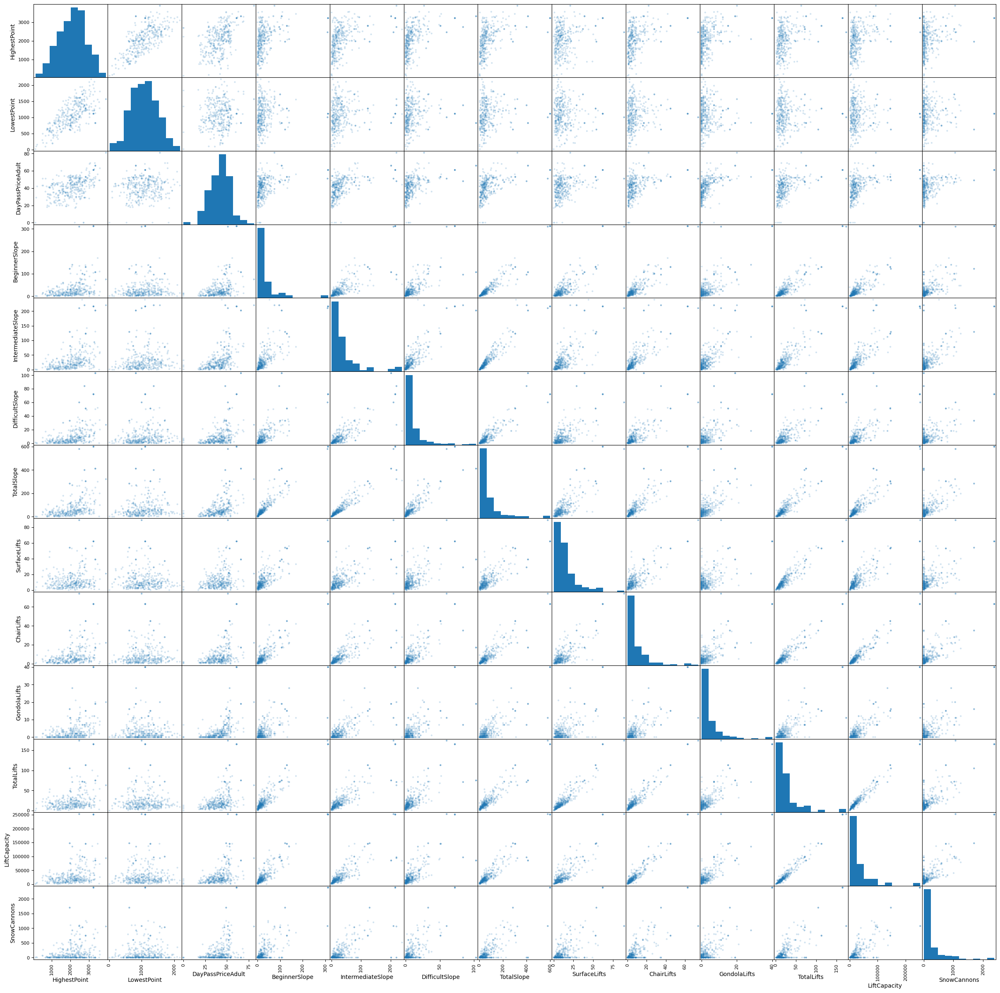

In [22]:
# your code

# Show correlations between the numerical attributes using scatter matrix
scatter_matrix(df_v, alpha=0.2, figsize=(30, 30));

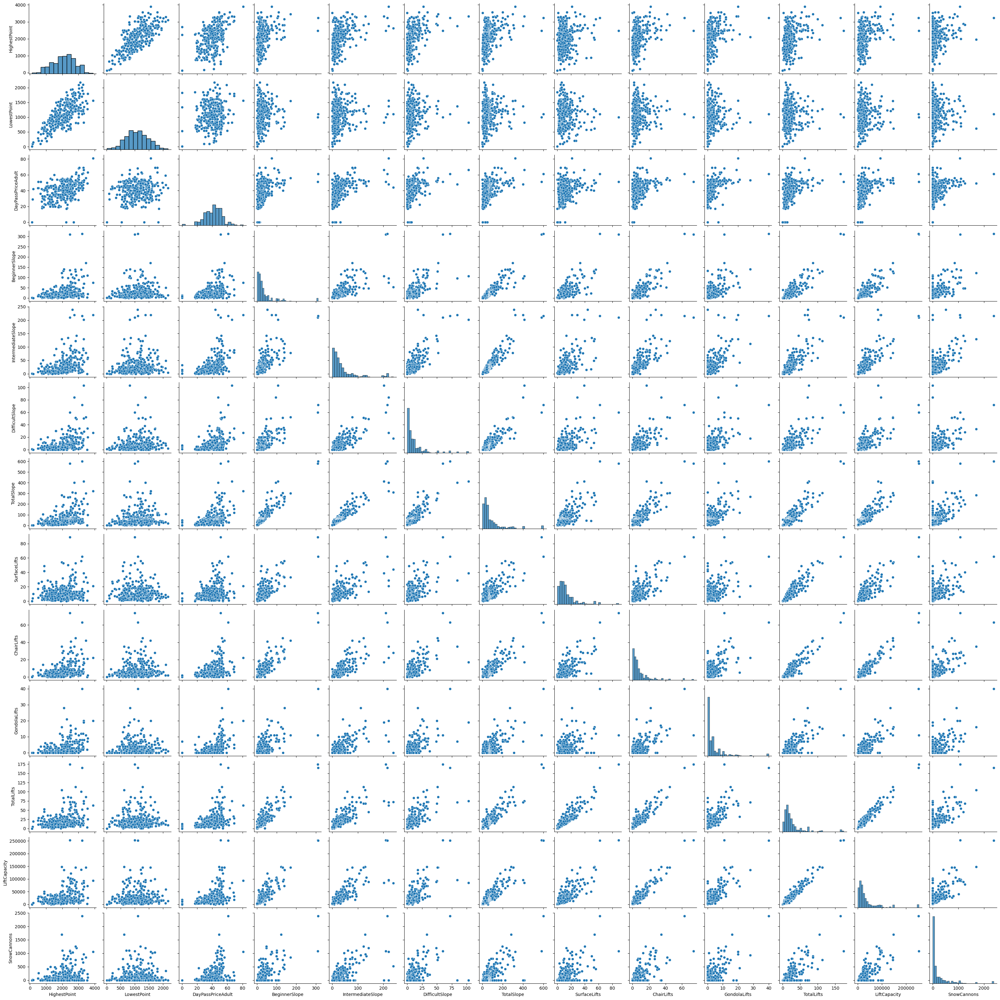

In [23]:
# Show correlations between the numerical attributes using seaborn pairplot
sns.pairplot(df_v);

### **b) (3pts)**
Another way to detect correlation is to calculate the Pearson correlation coefficient. Calculate the correlation matrix for the numerical data and visualize the matrix using a heatmap. 
Briefly discuss your findings from the heatmap and the scatter plot you created in 2(a).

Make sure to annotate the heatmap with the values of the correlation.

*Hint: You can use the heatmap function from seaborn to make the plot.*

HighestPoint  HighestPoint    1.000000
LowestPoint   LowestPoint     1.000000
LiftCapacity  LiftCapacity    1.000000
TotalLifts    TotalLifts      1.000000
GondolaLifts  GondolaLifts    1.000000
                                ...   
TotalLifts    LowestPoint     0.011693
GondolaLifts  LowestPoint    -0.012420
LowestPoint   GondolaLifts   -0.012420
              SurfaceLifts   -0.036061
SurfaceLifts  LowestPoint    -0.036061
Length: 169, dtype: float64

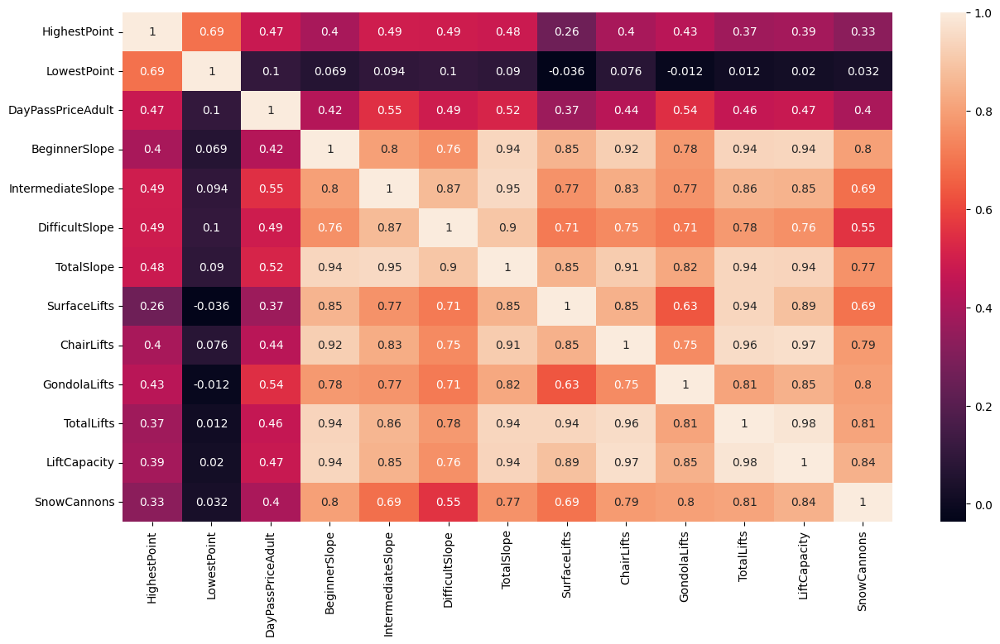

In [24]:
# your code
corr_matrix = df_v.corr(method='pearson')
plt.figure(figsize=(15,8))
sns.heatmap(corr_matrix, annot=True);
sorted_corr_matrix = corr_matrix.unstack().sort_values(ascending=False)
display(sorted_corr_matrix)

### Discussion over the Correlation Matrix and Pair Plot / Scatter Matrix

We can clearly observe from the correlation heatmap and the pair plots drawn above that we have a strong positive correlation between two attributes when their change pattren is similar, i.e., one increases (decreases) as the other one increases (decreases). Below, we provide some of the most correlated pairs of attributes as indicated by the correlation heatmap and the pair plots:

- **(LiftCapacity, TotalLifts)**: 0.98
- **(LiftCapacity, ChairLifts)**: 0.97
- **(ChairLifts, TotalLifts)**: 0.96
- **(IntermediateSlope, TotalSlope)**: 0.95
- **(LiftCapacity, BeginnerSlope)**: 0.94
- **(SurfaceLifts, TotalLifts)**: 0.94
- **(BeginnerSlope, TotalSlope)**: 0.94
- **(TotalLifts, TotalSlope)**: 0.94
- **(BeginnerSlope, TotalLifts)**: 0.94
- **(LiftCapacity, TotalSlope)**: 0.94
- **(ChairLifts, BeginnerSlope)**: 0.92
- **(TotalSlope, ChairLifts)**: 0.91
- **(DifficultSlope, TotalSlope)**: 0.90

By analyzing the correlation values assigned to the pairs above and by means of transitivity, we can find correlations between larger groups of attributes, e.g., *LifeCapacity*, *TotalLifts*, *ChairLifts*, and *BeginnerSlope* are highly and positively correlated to each other.

One important point worth mentioning is that there seem to be no attributes that are strongly negatively correlated to each other.

### **c) (4pts)** 
We now want to have an overview of the attribute "TotalSlope" aggregated by different levels of hierarchy (Europe -> Country -> Resort). It seems that a tree map is suitable for this purpose.

Make a tree map where
- the root node represents Europe.
- the child nodes of Europe are countries.
- the child nodes of each country are the ski resorts.
- the size of the rectangles is determined by the attribute "TotalSlope".

Also, use the tree map to find out
1. The sum of TotalSlopes of a country, list the top five countries and the corresponding values.
2. The max value of TotalSlope of the five countries you identified in 1.

*Hint: You can use the treemap function from plotly.express.*

In [24]:
# your code
fig = px.treemap(df, path=[px.Constant("Europe"), 'Country', 'Resort'], values='TotalSlope')
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

# In order to allow for a more convenient inspection, we also provide the aggregation using pandas 
agg_info = df_v.groupby(by='Country').agg(TotalSlope_Sum=('TotalSlope', sum), TotalSlope_Max=('TotalSlope', max)).sort_values(by='TotalSlope_Sum', ascending=False)
agg_info

,TotalSlope_Sum,TotalSlope_Max
Country,,
France,12546,600
Austria,7005,304
Switzerland,5710,412
Italy,3742,400
Andorra,723,210
Spain,708,150
Norway,377,71
Germany,321,40
Sweden,289,91


**Your answer for...** \
*...  1. The sum of TotalSlopes of a country. List the top five countries and the corresponding values:* \
*...  2. The max value of TotalSlope of the five countries you identified in 1:*

**Answer to the first question**:

1. France: 12546
2. Austria: 7005
3. Switzerland: 5710
4. Italy: 3742
5. Andorra: 723

**Answer to the second question**:

1. France: 600
2. Austria: 304
3. Switzerland: 412
4. Italy: 400
5. Andorra: 210

### **d) (3pts)** 

An alternative to a tree map is a sunburst plot, the principle is similar to a tree map. 

Recall from the lecture that:
- Each ring is a different level of the hierarchy
- Each segment of a ring belongs to one categorical value
- The size of a segment is either divided proportionally to a value

Now, we would like to have an overview of the attribute "TotalLifts" aggregated by different level of hierarchy.

Make a sunburst plot where
- the first hierarchy(ring) is "Country"
- the second hierarchy(ring) is "Snowparks" (whether the resort has snowparks)
- the third hierarchy(ring) is "Resort"
- the size of the segments is determined by the attribute "TotalLifts".

Then, briefly discuss your findings from the plot.

*Hint: You can use the sunburst function from plotly.express.*

In [71]:
# your code
df = px.data.tips()
fig = px.sunburst(df_v, path=['Country', 'Snowparks', 'Resort'], values='TotalLifts')
fig.show()

**Your answer:**

By observing the plot, we can see find out that the top 5 countries having the highest *TotalLifts* are  the same as the top 5 countries having the highest sum of *TotalSlopes*. These countries include *France, Austria, Switzerland, Italy, and Andorra*. It can also be observed that most of the resorts in these countries have *Snowparks* included.

## Question 3 - Frequent Item Sets and Association Rules (15 points)

In [3]:
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules as arule

### A real online retail transaction data set of two years.

Data Set Information:
This Retail dataset contains all the transactions occurring for a UK-based and registered, non-store online retail between 01/12/2009 and 09/12/2011.The company mainly sells unique all-occasion gift ware. Many customers of the company are wholesalers.

Attribute Information:
- Invoice: Invoice number. Nominal. A 6-digit integral number is uniquely assigned to each transaction. If the number starts with 'C' it refers to a canceled transaction.
- StockCode: Product (item) code. Nominal. A 5-digit integral number uniquely assigned to each distinct product.
- Description: Product (item) name. Nominal.
- Quantity: The quantities of each product (item) per transaction. Numeric.
- InvoiceDate: Invoice date and time. Numeric. The day and time when a transaction was generated.
- Price: Unit price. Numeric. Product price per unit in sterling (£).
- CustomerID: Customer number. Nominal. A 5-digit integral number is uniquely assigned to each customer. This number has postfix 'n'.
- Country: Country name. Nominal. The name of the country where a customer resides.

### a) Loading, exploring and preprocessing the dataset (4 pts)

#### **a(i)** 
Load the data from `retail.csv` and save it under the variable `retail_df`. Display the first few lines of the dataframe.

In [29]:
# your code
retail_df = pd.read_csv('./datasets/retail.csv')
retail_df.head()

# Note: We create a copy of the original retail df, so that certain outputs do not change along the way and as we make changes to the retail_df
retail_df_copy = retail_df.copy()

#### **a(ii)** 
To get to know the dataset, do the following:

- Show the number of rows in the dataset.
- Show the number of unique customers.
- Show the number of unique product names.
- Show the number of unique invoices.
- Show the number and the list of all the countries where the customers reside.

In [30]:
# your code

def display_dataset_info(dataset_df):
    print(f"Number of rows in the dataset: {len(dataset_df)}")
    print(f"Number of unique customers: {len(dataset_df['CustomerID'].unique())}")
    print(f"Number of unique product names: {len(dataset_df['Description'].unique())}")
    print(f"Number of unique invoices: {len(dataset_df['Invoice'].unique())}")
    print(f"Number of unique countries where the customers reside: {len(dataset_df['Country'].unique())}")
    print(f"List of unique countries where the customers reside:\n{dataset_df['Country'].unique().tolist()}")
    
display_dataset_info(retail_df_copy)

Number of rows in the dataset: 406525
Number of unique customers: 4367
Number of unique product names: 3896
Number of unique invoices: 22177
Number of unique countries where the customers reside: 35
List of unique countries where the customers reside:
['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany', 'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal', 'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland', 'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria', 'Israel', 'Finland', 'Greece', 'Singapore', 'Lebanon', 'United Arab Emirates', 'Saudi Arabia', 'Czech Republic', 'Canada', 'Brazil', 'USA', 'Bahrain', 'Malta', 'RSA']


#### **a(iii)** 
You are interested in analyzing itemsets that are frequently purchased together. Before continuing with that task, you have to make sure that the data are fit for such analysis. 1) More precisely, you want to make sure that there are no missing values in the data. 2) Moreover, you want to ensure that each item's name in the "Description" is consistent. E.g., you want "Description" values such as " coffee black", "coffee &nbsp;black", " coffee black &nbsp;", etc. to be mapped to the same value (e.g. "coffee black"). 3) Last but not least, you want to remove transactions that were canceled. Such transactions correspond to rows where the invoice number starts with letter 'C'.

Apply these preprocessing steps to the dataset `retail_df` and apply them on the dataframe itself (e.g. set inplace=True).

In [31]:
# your code

# First step: Check if there exists any missing value in the dataset
print(f"Total missing values: {retail_df.isna().sum().sum()}")

# Second step: Apply stripping/trimming to the description column and convert all the values to lower case to ensure integrity of values
retail_df["Description"] = retail_df["Description"].apply(lambda value: value.strip().lower())

# Third step: Removing cancelled transactions
retail_df = retail_df[retail_df['Invoice'].str[0] != 'C']

Total missing values: 0


#### **a(iv)** 
After applying the preprocessing steps in **a(iii)** , repeat again the task **a(ii)**, that is:

- Show the number of rows in the dataset.
- Show the number of unique customers.
- Show the number of all unique product names.
- Show the list of all the countries where the customers reside.

Which values changed?

In [32]:
# your code
display_dataset_info(retail_df)

Number of rows in the dataset: 397621
Number of unique customers: 4334
Number of unique product names: 3866
Number of unique invoices: 18524
Number of unique countries where the customers reside: 35
List of unique countries where the customers reside:
['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany', 'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal', 'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland', 'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Finland', 'Austria', 'Greece', 'Singapore', 'Lebanon', 'United Arab Emirates', 'Israel', 'Saudi Arabia', 'Czech Republic', 'Canada', 'Brazil', 'USA', 'Bahrain', 'Malta', 'RSA']


**Your answer:** 

By comparing the values obtained from the dataset before and after applying these preprocessing steps, we can state the following about different attributes:

1. **Number of rows in the dataset**: There has been a **reduction in the number of rows** in the dataset, which means that there were some canceled transactions in the original dataset.

2. **Number of unique customers**: There has been a **reduction in the number of unique customers** in the dataset, which means that some of the customers only had canceled transactions, and they no longer exist in the dataset after applying the preprocessing steps (mainly the removal of canceled transactions).

3. **Number of unique product names**: There has been a **reduction in the number of unique product names** in the dataset, which means that some of the products were only included in canceled transactions, and they no longer exist in the dataset after applying the preprocessing steps (mainly the removal of canceled transactions).

4. **List of all the countries where the customers reside**: There has been **no change in the number of unique countries where the customers reside**, which means that there exists at least one transaction related to each of these countries that was not canceled.

### b) Frequent itemsets and Association rules (8 pts)

#### **b(i)** 
Each invoice number in the dataset identifies a unique transaction. There are potentially many rows in the dataframe having the same invoice number. We want to analyze items that are frequently purchased together, that is, items that appear in the same transaction.

Create a new dataframe named `transaction_df` with two columns: "Invoice" and "Description". Here the "Invoice" value is the index of the dataframe (the unique number identifying each row) and "Description" is the column containing all items (without duplicates) purchased within the transaction with that invoice number. Display the first few rows of your dataframe. How many rows does the `transaction_df` have?

In [33]:
# your code
transaction_df = pd.DataFrame(retail_df.groupby('Invoice')['Description'].apply(lambda desc_value: desc_value.unique()))
display(transaction_df.head())
print(f"Number of rows in transaction_df: {len(transaction_df)}")

,Description
Invoice,
536365,"[white hanging heart t-light holder, white met..."
536366,"[hand warmer union jack, hand warmer red polka..."
536367,"[assorted colour bird ornament, poppy's playho..."
536368,"[jam making set with jars, red coat rack paris..."
536369,[bath building block word]


Number of rows in transaction_df: 18524


**Your answer:**

There are 18524 rows in the transactions dataframe (*transaction_df*). Note that this is consistent with the number of unique invoices we obtained after applying the preprocessing steps and removing the canceled transactions from the original retail dataset.

#### **b(ii)** 
Next, we want to compute frequent itemsets and association rules based on the sets of items ordered together. Use the TransactionEncoder to transform `transaction_df` into a matrix such that the value in the i-th row and the j-th column is $True$ if the i-th itemset contains product j, and $False$ otherwise. Save the matrix into a dataframe named `transactions`. Display the shape of the matrix.

*Hint: Note that your dataframe 'transactions' must contain as many rows as there are invoice numbers and as many columns as there are unique products.*

In [54]:
# your code

# OBtain a list of product names in list format
itemsets_data = transaction_df['Description'].tolist()
transaction_encoder = TransactionEncoder()
# Construct the matrix whose entries indicate whether an item is included in the corresponding itemset
boolean_matrix = transaction_encoder.fit(itemsets_data).transform(itemsets_data)
# Create new dataframe such that the names of the products appear as column names
transactions = pd.DataFrame(boolean_matrix, columns = transaction_encoder.columns_)
display(transactions.head())
print(f"Shape of transactions matrix: {transactions.shape}")

assert len(transactions) == len(retail_df['Invoice'].unique())
assert len(transactions.columns) == len(retail_df['Description'].unique())

,10 colour spaceboy pen,12 coloured party balloons,12 daisy pegs in wood box,12 egg house painted wood,12 hanging eggs hand painted,12 ivory rose peg place settings,12 message cards with envelopes,12 pencil small tube woodland,12 pencils small tube red retrospot,12 pencils small tube skull,...,zinc star t-light holder,zinc sweetheart soap dish,zinc sweetheart wire letter rack,zinc t-light holder star large,zinc t-light holder stars large,zinc t-light holder stars small,zinc top 2 door wooden shelf,zinc willie winkie candle stick,zinc wire kitchen organiser,zinc wire sweetheart letter tray
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Shape of transactions matrix: (18524, 3866)


#### **b(iii)** 
Use the apriori method on `transactions` to obtain all frequent itemsets using min_support=0.01. Display all frequent itemsets that have at least three items. What support count does an itemset have for our case if it satisfies min_support=0.01?

In [59]:
# Utility function to get the frequent item sets by their size
def get_freq_itemsets_by_size(frequent_itemsets, min_size):
    data = frequent_itemsets[frequent_itemsets['itemsets'].apply(lambda itemset: len(itemset) >= min_size)]
    return data

In [55]:
# your code

# Apply apriori algorithm to get all frequent itemsets with minimum support of 0.01
frequent_itemsets = apriori(transactions, min_support=0.01, use_colnames=True)

,support,itemsets
0,0.013064,(10 colour spaceboy pen)
1,0.010041,(12 message cards with envelopes)
2,0.014900,(12 pencil small tube woodland)
3,0.016573,(12 pencils small tube red retrospot)
4,0.015709,(12 pencils small tube skull)
...,...,...
967,0.011984,"(lunch bag suki design, lunch bag red retrospo..."
968,0.014306,"(regency cakestand 3 tier, roses regency teacu..."
969,0.010041,"(poppy's playhouse bedroom, poppy's playhouse ..."
970,0.012902,"(regency cakestand 3 tier, roses regency teacu..."


In [68]:
import math

# Get frequent itemsets of size at least 3
frequent_itemsets_filtered = get_freq_itemsets_by_size(frequent_itemsets, min_size=3)
display(frequent_itemsets_filtered)

# Calculate support count for a min support of 0.01
min_support = 0.01
support_count = len(transactions) * 0.01
print(f"Support count for a min_support of {min_support}: {support_count} -> {math.ceil(support_count)}")

,support,itemsets
919,0.011607,"(alarm clock bakelike green, alarm clock bakel..."
920,0.014414,"(alarm clock bakelike green, alarm clock bakel..."
921,0.014630,"(regency cakestand 3 tier, pink regency teacup..."
922,0.021054,"(roses regency teacup and saucer, pink regency..."
923,0.016843,"(regency cakestand 3 tier, roses regency teacu..."
924,0.012524,"(jumbo bag strawberry, jumbo bag pink polkadot..."
925,0.010149,"(jumbo shopper vintage red paisley, jumbo bag ..."
926,0.011876,"(jumbo storage bag suki, jumbo bag pink polkad..."
927,0.010095,"(jumbo storage bag suki, jumbo shopper vintage..."
928,0.010095,"(lunch bag red retrospot, jumbo bag red retros..."


Support count for a min_support of 0.01: 185.24 -> 186


**Your answer:**

In order to answer the question, we refer to the notions of **support** and **support count**:

- **support(X)**: The number of itemsets in the dataset containing the items available in X divided by the total size of the dataset. (This is a relative value)
- **support_count(X)**: The number of itemsets in the dataset containing the items available in X. (This is an absolute value, also called frequency or count)

By the calculations we have done above, we can see that we need a support count of at least 185.24, which we should round up (because support count cannot be a float number) and we get a **support count of at least 186**.

### TODO: Include formulas later.

#### **b(iv)**
Now we will discover association rules from the frequent itemsets. Using only the frequent itemsets with min_support=0.01 (the ones obtained in **b(iii)**), generate different association rules using min_conf=0.6 and min_conf=0.9 as thresholds. Show the association rules for each of the thresholds. What do you notice w.r.t. the number of association rules produced for the different thresholds?

In [72]:
# your code

# Find association rules using minimum confidence of 0.6
association_rules_conf1 = arule(frequent_itemsets, metric = 'confidence', min_threshold = 0.6)

# Find association rules using minimum confidence of 0.9
association_rules_conf2 = arule(frequent_itemsets, metric = 'confidence', min_threshold = 0.9)

# Display the association rules obtained using different thresholds
print(f"Association rules using a minimum confidence of 0.6 (Size: {len(association_rules_conf1)})")
display(association_rules_conf1)
print(f"Association rules using a minimum confidence of 0.9: (Size: {len(association_rules_conf2)})")
display(association_rules_conf2)

Association rules using a minimum confidence of 0.6 (Size: 142)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(alarm clock bakelike chocolate),(alarm clock bakelike green),0.017383,0.042593,0.011337,0.652174,15.311622,0.010596,2.752544
1,(alarm clock bakelike chocolate),(alarm clock bakelike red),0.017383,0.047290,0.012200,0.701863,14.841686,0.011378,3.195548
2,(alarm clock bakelike orange),(alarm clock bakelike green),0.019380,0.042593,0.011876,0.612813,14.387522,0.011051,2.472726
3,(alarm clock bakelike green),(alarm clock bakelike red),0.042593,0.047290,0.028612,0.671736,14.204617,0.026597,2.902271
4,(alarm clock bakelike red),(alarm clock bakelike green),0.047290,0.042593,0.028612,0.605023,14.204617,0.026597,2.423954
...,...,...,...,...,...,...,...,...,...
137,"(regency cakestand 3 tier, green regency teacu...","(roses regency teacup and saucer, pink regency...",0.020190,0.023537,0.012902,0.639037,27.150297,0.012427,2.705164
138,"(lunch bag black skull., lunch bag red retros...",(lunch bag pink polkadot),0.014144,0.050259,0.010419,0.736641,14.656866,0.009708,3.606262
139,"(lunch bag black skull., lunch bag red retros...",(lunch bag cars blue),0.016627,0.052149,0.010419,0.626623,12.016119,0.009552,2.538593
140,"(lunch bag black skull., lunch bag cars blue,...",(lunch bag red retrospot),0.014036,0.069531,0.010419,0.742308,10.675860,0.009443,3.610774


Association rules using a minimum confidence of 0.9: (Size: 3)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(regency tea plate pink),(regency tea plate green),0.012092,0.014576,0.010905,0.901786,61.869180,0.010729,10.033411
1,"(poppy's playhouse livingroom, poppy's playhou...",(poppy's playhouse kitchen),0.011067,0.018678,0.010041,0.907317,48.575553,0.009834,10.587943
2,"(regency cakestand 3 tier, roses regency teacu...",(green regency teacup and saucer),0.014306,0.037303,0.012902,0.901887,24.177353,0.012369,9.812104


**Your answer:**

From the results obtained above, we can clearly see that the number of association rules dramatically decreases from 142 to 3 as we increase the minimum confidence from 0.6 to 0.9. This was indeed expected since the number of association rules tends to decrease as we increase the minimum threshold for the confidence value.

#### **b(v)** 
From the association rules that satisfy the confidence threshold 0.6, select and show the two rules with the highest lift. What do you notice if you compare the two rules with each other?

In [75]:
# your code

# Sort the association rules based on the lift value
association_rules_lift_sorted = association_rules_conf1.sort_values(by='lift', ascending=False)

# Display the two rules with the highest lift
display(association_rules_lift_sorted.iloc[:2, :])

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
54,(regency tea plate pink),(regency tea plate green),0.012092,0.014576,0.010905,0.901786,61.86918,0.010729,10.033411
53,(regency tea plate green),(regency tea plate pink),0.014576,0.012092,0.010905,0.748148,61.86918,0.010729,3.922574


**Your answer:**

By observing the two rules with the highest lift, we can see that the position of the itemsets in the rules is exchanged, i.e., the antecedents of the first rule are the consequents of the second rule and the antecedents of the second rule are the consequents of the first rule. This is actually true because the lift value is independent of the position of the rules in an association rule.

$$
lift(A \Rightarrow  B) = \frac{support(A \cup B)}{support(A) * support(B)}
$$

$$
lift(B \Rightarrow  A) = \frac{support(B \cup A)}{support(B) * support(A)}
$$

So, we can conclude that $lift(A \Rightarrow  B) = lift(B \Rightarrow  A)$

#### **b(vi)** 

In the analysis tasks in **b)**, an itemset consisted of items that had the same invoice number (same transaction items). Thus, if an itemset was frequent, it meant that the items in it were frequently purchased together.
An association rule $A \Rightarrow B$ meant that if items in $A$ are purchased, then the items in $B$ are also purchased in that same transaction.

Suppose that we would repeat the analysis, but this time, the itemsets would consist of items having the same "CustomerID" (bought from the same customer). Interpret the meaning of the frequent itemsets and association rules for this kind of itemsets.

**Your answer:**

### Considerations / Inquiries
1. Make sure the conclusion is correct

If the itemsets are constructed based on having the same *CustomerID*, a frequent itemset indicates that the items in the itemset are frequently purchased, but this does not indicate that they're purchased together in one transaction. Moreover, an association rule in the form of $lift(A \Rightarrow  B)$ indicates that if the items in A are purchased, then the items in B are also purchased by that customer, but not necessarily in one transaction.

### c) Sequence Mining (3 pts)

For this task, the dataset used is `retail_sequences.csv`. Run the cell below to save the dataset under the dataframe `retail_sequences`. Each row in the dataframe corresponds to a unique customer (from the retail dataset). The "Customer" column contains the customer ID, whereas the "Sequence" column contains the sequence of itemsets  purchased by that customer.  Each value of "Sequence" is a sequence (list) of itemsets $<I_1, I_2, ..., I_n>$. The items within the same itemset (list without duplicates) $I_i$ were purchased together (they had the same invoice number). The itemsets are ordered by the timestamp of the transaction (value of InvoiceDate).

In [82]:
import pandas as pd 
retail_sequences = pd.read_csv('datasets/retail_sequences.csv', converters={'Sequence': pd.eval})

In [113]:
def is_contained(first_seq, second_seq):
    if len(first_seq) > len(second_seq):
        return False
    for first_index, first_itemset in enumerate(first_seq):
        found = False
        for second_index, second_itemset in enumerate(second_seq[first_index:]):
            if set(first_itemset).issubset(second_itemset):
                found = True
                break
        if not found:
            return False
    
    return True 

Given is the sequence *s= <{'lunch bag cars blue'}, {'herb marker rosemary','herb marker thyme'}, {'wooden star christmas scandinavian'}>*. Compute the support count of that sequence, that is, compute the number of customers whose corresponding itemset sequence contains it. Display its support count and the IDs of those customers.

*Hint: In the dataset provided, all product names are unified. They are all lowercase and have no trailing spaces.*

### Considerations / Inquiries

1. Does the order of itemsets (not the items in the items sets, because they really don't matter) matter?

In [114]:
s = [['lunch bag cars blue'], ['herb marker rosemary', 'herb marker thyme'] ,['wooden star christmas scandinavian']]

In [121]:
# your code    

candidates = []
customer_sequence_pairs = retail_sequences.values
for customer_sequence_pair in customer_sequence_pairs:
    customer, sequence = customer_sequence_pair
    if is_contained(s, sequence):
        candidates.append(customer_sequence_pair)

candidates_df = pd.DataFrame(data=candidates, columns=retail_sequences.columns)

print(f"Support Count: {len(candidates)}")
display(candidates_df)

Support Count: 8


,Customer,Sequence
0,127480,"[[cream sweetheart egg holder], [green christm..."
1,149110,"[[rose cottage keepsake box, blue charlie+lola..."
2,178410,"[[skulls and crossbones wrap, polyester filler..."
3,130500,"[[family photo frame cornice, red retrospot wr..."
4,150340,"[[enamel colander cream, set/20 red retrospot ..."
5,132630,"[[please one person metal sign, man flu metal ..."
6,131370,"[[blue charlie+lola personal doorsign, traditi..."
7,144560,"[[jumbo shopper vintage red paisley, jumbo bag..."


## Question 4: Text Mining (12 pts)

In [250]:
import nltk
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.lm.preprocessing import padded_everygram_pipeline
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score
import multiprocessing
from nltk.lm.preprocessing import padded_everygram_pipeline
from nltk.lm import MLE

In [58]:
nltk.download('punkt')
nltk.download("stopwords")
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt to /home/sandman/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/sandman/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/sandman/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/sandman/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

### F.R.I.E.N.D.S.

In this task we will use the script from the well-known series "F.R.I.E.N.D.S.". We will apply feature extraction methods to map the line of each main character onto a vector of a vector space. Then we will train a classifier whose aim will be to predict the name of the character given a particular line from the script.
In the end, we will train language models using N-grams and produce fake sentences for each of the main characters.

### a) Data Loading and Preprocessing (4 pts)

#### **a(i)** 
Import the file `FRIENDS.csv` and save it into a dataframe named `friends_df`. Note that the dataframe must contain two columns: one indicating the character's name and one containing a line from the script. Display the first few lines from the dataframe.

<i>FYI: The script has been filtered so that it only contains lines from the main characters. The order of the lines in the data is the same as the order of the lines in the original script. Metadata and scene descriptions have been removed. Your corpus consists of all the lines contained in the data. Each row's "line" value is a single document. </i>

In [59]:
# your code
friends_df = pd.read_csv("./datasets/FRIENDS.csv")
display(friends_df.head())
print(f"Unique characters: {friends_df['character'].unique()}")

,character,line
0,Monica,There's nothing to tell! He's just some guy I...
1,Joey,C'mon you're going out with the guy! There's...
2,Chandler,All right Joey be nice. So does he have a h...
3,Phoebe,Wait does he eat chalk?
4,Phoebe,Just 'cause I don't want her to go through ...


Unique characters: ['Monica' 'Joey' 'Chandler' 'Phoebe' 'Ross' 'Rachel']


#### **a(ii)**  
Plot the line count distribution among the six main characters (the six possible values of the column "character"). For example, show a plot containing one bar for each character whose height reflects the number of lines in `friends_df`. Briefly comment on the plot.

,line
character,
Chandler,7687
Joey,7573
Monica,7651
Phoebe,6833
Rachel,8506
Ross,8264


character
Chandler    0.165262
Joey        0.162811
Monica      0.164488
Phoebe      0.146902
Rachel      0.182870
Ross        0.177667
Name: line, dtype: float64

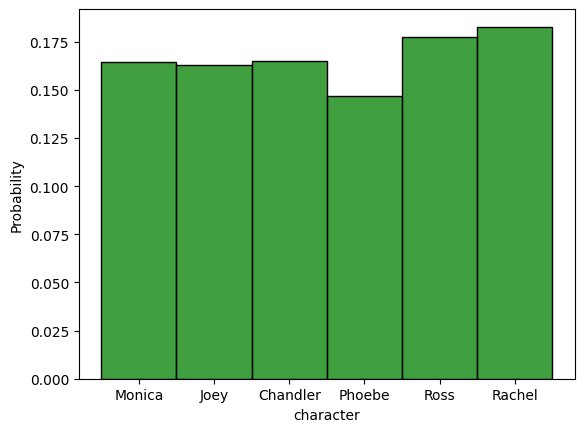

In [156]:
# your code

# Count and display the number of lines for each of the six character
display(friends_df.groupby(by='character').count())
display(friends_df.groupby(by="character")['line'].apply(lambda my_df: my_df.count() / len(friends_df)))
sns.histplot(data=friends_df, x="character", color='g', stat='probability');

**Your answer:**

We can observe from the aggregated data frame and the plot shown above that **Rachel has the most number of lines** and **Phoebe has the least number of lines**. The number of lines per character in a decreasing order is leasted below:

- **Rachel**:	8506
- **Ross**:	8264
- **Chandler**:	7687
- **Monica**:	7651
- **Joey**:	7573
- **Phoebe**:	6833

#### **a(iii)**  
Create a corpus named `corpus` such that each document in the corpus corresponds to exactly one row's "line" in `friends_df`.

In [61]:
# your code
corpus = friends_df['line'].tolist()

#### **a(iv)**  
Write a function called `my_preprocessor` which, given a string, returns another string after tokenization, stopword removal and lemmatization have been applied. The remaining terms (tokens after stopword removal and lemmatization has been applied) should be joined in the same string using space ' '.

In [62]:
# your code

tokenizer = nltk.RegexpTokenizer(r"\w+")
stop_list = stopwords.words("english")
lemmatizer = WordNetLemmatizer()

def my_preprocessor(text):
    # Tokenize the text
    tokenized = tokenizer.tokenize(text)
    # Remove stopwords from within the list of tokenized elements (tokens)
    filtered = [word.lower() for word in tokenized if word.lower() not in stop_list]
    # Apply lemmatization to the tokens after stopword removal
    lemmatized = [lemmatizer.lemmatize(word) for word in filtered]
    # Join the lemmatized tokens into a space-separated string format
    return ' '.join(lemmatized)

#### **a(v)**   
You must apply your preprocessor `my_preprocessor` on each line contained in the `corpus`. Create a preprocessed corpus named `corpus_p` which contains the same lines as `corpus` after the preprocessor `my_preprocessor` has been applied.

In [63]:
# your code
corpus_p = []

# Apply the defined preprocessor to each document / corpora in the corpus
for doc in corpus:
    doc_p = my_preprocessor(doc)
    corpus_p.append(doc_p)

#### **a(vi)**   
Split the `friends_df` dataset from the previous task into training (80%) and test (20%) data preserving the distribution based on the "character" value. 

In [73]:
# your code
target = friends_df['character'].tolist()
train_data, test_data = train_test_split(friends_df, test_size=0.2, stratify=target)

#### **a(vii)**   
Similar to **a(iii)**, for the training data and the test data, create two corpora named `corpus_train` and `corpus_test` respectively. Each document in the training (test) corpus must correspond to exactly one row's "line" value in the corresponding training (test) dataframe.

In [78]:
# your code
corpus_train = train_data['line'].tolist()
corpus_test = test_data['line'].tolist()

### b) Set of Words (4.5 pts)

#### **b(i)**  
We want to encode our text in such a way that for each word in the vocabulary, we are only interested in whether the word appears or not in a given document. Create such a Set of Words encoding for the whole corpus `corpus`. Use the previously defined preprocessor `my_preprocessor` as preprocessor.

In [70]:
# your code
sow = CountVectorizer(binary=True, preprocessor=my_preprocessor)
corpus_vectors = sow.fit(corpus)

#### **b(ii)**  
Pick one (any) of the lines of the "line" column in the `friends_df` dataset. Display the line in:
    1) its original form, 
    2) its preprocessed version (the result contained in `corpus_p` after applying `my_preprocessor`), and 
    3) its encoding computed by the Set of Words method. This can be either an array (a vector) or a scipy matrix. 
Briefly comment on the Set of Words encoding.

In [121]:
# your code
random_line = friends_df['line'].sample()
random_line_index = random_line.index[0]
random_line_value = random_line.tolist()[0]
print(f"1. Original form: {random_line_value}")
preprocessed = corpus_p[random_line_index]
print(f"2. Preprocessed version: {preprocessed}")
print('3. SoW encoding:', sow.transform([random_line_value]).toarray())

1. Original form:  Are you angry at me because I said your handwriting is childlike?
2. Preprocessed version: angry said handwriting childlike
3. SoW encoding: [[0 0 0 ... 0 0 0]]


**Your answer:**

#### **b(iii)**  
Create a Set of Words encoding based only on the documents in `corpus_train`. Use the previously defined preprocessor `my_preprocessor` as a preprocessor.

In [131]:
# your code

# Fit a set of words encoder to the training data
sow_from_train = CountVectorizer(binary=True, preprocessor=my_preprocessor)
sow_from_train.fit(corpus_train) 

# Apply the set of words encoder to both the training and test data
X_train = sow_from_train.transform(corpus_train)
X_test = sow_from_train.transform(corpus_test)

# Define characters as the target values
y_train = train_data['character'].tolist()
y_test = test_data['character'].tolist()

#### **b(iv)**  
In this task, we will use an SGD (Stochastic Gradient Descend) classifier to predict the character given a line from the corpus. Train the classifier on the Set of Words encoding of training corpus `corpus_train` using the character as the target feature and 'log_loss' as the loss function. Apply the classifier on the Set of Words encodings of both the training corpus and the test corpus `corpus_train`. Show its accuracy for both the training corpus and the test corpus.

### Considerations / Inquiries

1. Check if a one-hot encoding of characters is required
2. Consider using grid search

In [133]:
# your code
sow_sgd_clf = SGDClassifier(loss="log_loss")
sow_sgd_clf.fit(X_train, y_train)

y_train_pred = sow_sgd_clf.predict(X_train)
y_test_pred = sow_sgd_clf.predict(X_test)

accuracy_sow_train = accuracy_score(y_train, y_train_pred, normalize=True)
print('Classifier accuracy on training set:', accuracy_sow_train)

accuracy_sow_test = accuracy_score(y_test, y_test_pred, normalize=True)
print('Classifier accuracy on test set:', accuracy_sow_test)

Classifier accuracy on training set: 0.422052618849265
Classifier accuracy on test set: 0.2928087713640761


#### **b(v)**  
Briefly comment on the accuracy of the classifier compared to the expected accuracy of a random guesser (here: a model that simply guesses each character according to a distribution based on the line count). Use the line count distribution shown in **a(ii)** to reason about the approximate accuracy of the random guesser.

**Your answer:**

As we can observe from the plots and aggregated values which indicate the absolute and relative frequency of the lines for each character, we can conclude that the accuracy of the classifier is at least slightly better than random guessing. This is because the accuracy of the classifier obtained by predicting both the training set and the test set is better than the probability of guessing the character based on their line frequency.

#### **b(vi)**  
Pick two lines from the dataset `friends_df`. Predict their character by applying the SGD classifier from **b(iv)** to their Set of Words encodings. Show the original lines, their original characters and the predicted characters.

In [175]:
# your code
random_data = friends_df.sample(n=2)
original_lines = random_data['line'].tolist()
original_characters = random_data['character'].tolist()
random_X = sow_from_train.transform(original_lines)
predicted_characters = sow_sgd_clf.predict(random_X)
print(f"Original lines:\n1. {original_lines[0]}\n2. {original_lines[1]}")
print(f"Original characters:\n1. {original_characters[0]}\n2. {original_characters[1]}")
print(f"Predicted characters:\n1. {predicted_characters[0]}\n2. {predicted_characters[1]}")

Original lines:
1.  Oh  yeah  he's my... he's my best friend.
2.  Oh thank you  Chandler  this is so great  she’s gonna love me.
Original characters:
1. Chandler
2. Rachel
Predicted characters:
1. Phoebe
2. Rachel


### c) Doc2Vec (1.5 pts)

#### **c(i)**  
In this part, we want to encode the lines using Doc2Vec. Create a Doc2Vec embedding based on the documents in the preprocessed corpus `corpus_p`. Set the vector dimension to 10 and min_count to 3.

In [178]:
# your code
docs = [TaggedDocument(doc, [i]) for i, doc in enumerate(corpus_p)]

# Determine the number of cores for multiprocessing
cores = multiprocessing.cpu_count()

# determining parameters of the model   
doc2vec = Doc2Vec(vector_size=10, min_count=3, workers=cores)

# Build the vocabulary by providing the whole set of documents 
doc2vec.build_vocab(docs)

# Create the embeddings of all documents in the corpus
doc2vec.train(corpus_iterable=docs, total_examples=doc2vec.corpus_count, epochs=100)

#### **c(ii)**  
Pick one (any) line from the dataset `friends_df`. Display the line and the character saying it. Find its most similar line w.r.t. the Doc2Vec encoding and display the original line and its corresponding character. Do the lines belong to the same character?

In [203]:
# your code

random_item = friends_df.sample(n=1)
random_index = random_item.index[0]
random_char = random_item['character'].item()
random_line_original = random_item['line'].item()
random_line_preprocessed = corpus_p[random_index]
random_embedding = doc2vec.infer_vector(tokenizer.tokenize(random_line_preprocessed))
most_similar_docs = doc2vec.dv.most_similar(random_embedding)
tag, similarity = most_similar_docs[0]
similar_instance = friends_df.iloc[tag]
similar_line = similar_instance['line']
similar_char = similar_instance['character']
print(f"(Orignal line, Original character): ({random_line_original}, {random_char})")
print(f"(Similar line, Similar character): ({similar_line}, {similar_char})")

(Orignal line, Original character): ( Then why would he say it?, Monica)
(Similar line, Similar character): ( From here to the airport?, Monica)


**Your answer:**

We have randomly picked a line and its character from the dataset, and obtained the most similar document to this line based on the cosine similarity of the embedding vectors representing the documents. the line which has been chosen as similar to the original line has the same character as the original one, but there are many discrepancies between the original character and the similar one if we run the cell multiple times.

### d) Language model using N-grams (2 pts)

#### For the following tasks, use the `friends_df` data.

#### **d(i)**  
For each character, create a corresponding corpus. Each corpus must be a list of documents. Each document corresponds to one "line" value of that character and it should be a list of terms. You must obtain this list of terms after applying preprocessing steps such as to lowercase, no punctuation, and tokenization to the original line. Do not perform stemming/lemmatization and/or stopword removal for this task.
Display the corpus of one of the characters.

In [254]:
# your code

character_lines_map = friends_df.groupby(by='character')['line'].apply(list).to_dict()
character_corpus_map = {}

for character, lines in character_lines_map.items():
    # Convert to lower case and remove punctuations
    preprocessed_lines = [tokenizer.tokenize(line.lower()) for line in lines]
    character_corpus_map[character] = preprocessed_lines

character = list(character_lines_map.keys())[0]
print(f"Corpus of {character}: {character_corpus_map[character]}")

Corpus of Chandler: [['all', 'right', 'joey', 'be', 'nice', 'so', 'does', 'he', 'have', 'a', 'hump', 'a', 'hump', 'and', 'a', 'hairpiece'], ['sounds', 'like', 'a', 'date', 'to', 'me'], ['alright', 'so', 'i', 'm', 'back', 'in', 'high', 'school', 'i', 'm', 'standing', 'in', 'the', 'middle', 'of', 'the', 'cafeteria', 'and', 'i', 'realize', 'i', 'am', 'totally', 'naked'], ['then', 'i', 'look', 'down', 'and', 'i', 'realize', 'there', 's', 'a', 'phone', 'there'], ['that', 's', 'right'], ['all', 'of', 'a', 'sudden', 'the', 'phone', 'starts', 'to', 'ring', 'now', 'i', 'don', 't', 'know', 'what', 'to', 'do', 'everybody', 'starts', 'looking', 'at', 'me'], ['finally', 'i', 'figure', 'i', 'd', 'better', 'answer', 'it', 'and', 'it', 'turns', 'out', 'it', 's', 'my', 'mother', 'which', 'is', 'very', 'very', 'weird', 'because', 'she', 'never', 'calls', 'me'], ['cookie'], ['sometimes', 'i', 'wish', 'i', 'was', 'a', 'lesbian', 'did', 'i', 'say', 'that', 'out', 'loud'], ['and', 'i', 'just', 'want', 'a', 

#### **d(ii)**  
For each character separately, build a trigram language model using MLE. Use both right and left padding and learn each language model using the character's corpus from **d(ii)**.

In [255]:
# your code

character_ngram_map = {}

def build_ngram_model(corpus, n, padding):
    # Apply left and right padding to the documents in the corpus
    padded_tuples, vocab = padded_everygram_pipeline(padding, corpus)
    # Generate (an empty) ngram language model for some n > 0
    lm_ngram = MLE(n)
    # Generate probabilities (model) given the list of n-grams and the vocabulary
    lm_ngram.fit(padded_tuples, vocab)
    return lm_ngram

for character, corpus in character_corpus_map.items():
    character_ngram_map[character] = build_ngram_model(corpus, n=3, padding=1)

#### **d(iv)**  
For each character, use the created trigram language model to generate a sentence of ten words. Display the sentences.

In [256]:
# your code
for character in character_corpus_map.keys():
    character_ngram_model = character_ngram_map[character]
    character_generated_sentence = character_ngram_model.generate(10)
    print(f"Generated sentence for {character}: {character_generated_sentence}")

Generated sentence for Chandler: ['shower', 'only', 'some', 'the', 'i', 'batman', 't', 'of', 'it', 'party']
Generated sentence for Joey: ['and', 'woman', 'having', 'what', 'sexy', 'want', 'know', 'thank', 'if', 'say']
Generated sentence for Monica: ['ready', 'playing', 'were', 'and', 'once', 'ice', 'out', 'may', 'catching', 'geena']
Generated sentence for Phoebe: ['you', 't', 'this', 'set', 'what', 'i', 'at', 'totally', 'phoebe', 'you']
Generated sentence for Rachel: ['so', 'even', 'street', 'but', 'if', 'i', 'have', 'to', 't', 'did']
Generated sentence for Ross: ['you', 'i', 'just', 'oh', 'would', 'none', 'about', 'me', 'doing', 'emily']


## Question 5: Process Mining (22pts)

In [1]:
import pandas as pd
import pm4py

In [2]:
from pm4py.statistics.traces.generic.log import case_statistics

In [3]:
from pm4py.algo.conformance.tokenreplay import algorithm as token_based_replay

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

### a) Loading the Data and Basic Statistics (9pts)

#### **a(i)** 
Load the data **reimburse.csv** and create a PM4Py event log. In doing so, use the following column mapping:
 - *Activity* is the activity key
 - *Case* is the case ID
 - *Timestamp* is the timestamp

In [5]:
# your code
reimburse_df = pd.read_csv('./datasets/reimburse.csv', sep=',')
display(reimburse_df.head())
reimburse_df = pm4py.format_dataframe(reimburse_df, case_id='CaseId', activity_key='Activity', timestamp_key='Timestamp', ) # Simplified interface. Does the formating for you
# Let's see what this does
display(reimburse_df.head())
reimburse_log = pm4py.convert_to_event_log(reimburse_df)

,Timestamp,CaseId,Activity,ModelTime,Resource,Brand
0,2020-06-01 06:00:00,0,Online,0,111,PEAR
1,2020-06-01 06:16:43,1,Online,1003,111,CP
2,2020-06-01 08:21:49,2,App,8509,111,CP
3,2020-06-01 09:19:59,0,Register Low,11999,1,PEAR
4,2020-06-01 09:26:51,0,Ask if Reimbursement,12411,1,PEAR


,Timestamp,CaseId,Activity,ModelTime,Resource,Brand,case:concept:name,concept:name,time:timestamp,@@index
0,2020-06-01 06:00:00+00:00,0,Online,0,111,PEAR,0,Online,2020-06-01 06:00:00+00:00,0
1,2020-06-01 09:19:59+00:00,0,Register Low,11999,1,PEAR,0,Register Low,2020-06-01 09:19:59+00:00,1
2,2020-06-01 09:26:51+00:00,0,Ask if Reimbursement,12411,1,PEAR,0,Ask if Reimbursement,2020-06-01 09:26:51+00:00,2
3,2020-06-03 09:52:18+00:00,0,Pay,186738,2,PEAR,0,Pay,2020-06-03 09:52:18+00:00,3
4,2020-06-01 06:16:43+00:00,1,Online,1003,111,CP,1,Online,2020-06-01 06:16:43+00:00,4


#### **a(ii)** 
Compute and print the following basic information:
- Number of events
- Number of cases
- Earliest timestamp
- Latest timestamp
- Number of trace variants

In [6]:
# your code
time_sorted_df = reimburse_df.sort_values(by='Timestamp')
# Get the trace variants of the event log 
variants = pm4py.get_variants_as_tuples(reimburse_log)
variants = [(k, len(v)) for k, v in variants.items()]
variants = sorted(variants, key=lambda x: x[1], reverse=True)

# An event refers to a case, an activity, and a point in time. Each row of our CSV file is an event
print(f"Number of events: {len(reimburse_df)}")

# A case can be seen as a trace/sequence of events
print(f"Number of traces: {len(reimburse_log)}")
print(f"Number of cases: {(len(reimburse_df['CaseId'].unique()))}")
print(f"Earliest timestamp: {time_sorted_df.iloc[0]['Timestamp']}")
print(f"Latest timestamp: {time_sorted_df.iloc[-1]['Timestamp']}")
print(f"Number of trace variants: {len(variants)}")

Number of events: 47830
Number of traces: 10000
Number of cases: 10000
Earliest timestamp: 2020-06-01 06:00:00+00:00
Latest timestamp: 2022-03-10 12:14:51+00:00
Number of trace variants: 266


#### **a(iii)** 
In process mining, multiple events that have the same timestamp can cause problems because the ordering of events (or even activities) becomes unclear. Moreover, they can indicate batching (i.e., one activity is executed for multiple cases simultaneously). Therefore, during your analysis, it is good to keep that in mind. To this end, compute the following statistics/answer the following questions:

1. How many events occur almost at the same time (i.e., within less than 100ms as the preceding event. (Proceeding event in the *entire* event log)?
2. Are there resources that complete two activities at the same time (within less than 100ms)?
3. How many cases are there in which two activities are executed at the same time (i.e., two events that belong to the same case occur within less than 100ms)?

*Hint: Depending on how you find the answers, be careful about event orderings.*

In [7]:
# your code

# re_df_copy = reimburse_df.copy()


from pm4py.statistics.concurrent_activities.log import get as conc_act_get
# x = time_sorted_df.iloc[0]['Timestamp']
# y = time_sorted_df.iloc[1]['Timestamp']
# # time_sorted_df
# (x - y) / pd.Timedelta(milliseconds=1)
# conc_act = conc_act_get.apply(reimburse_log, parameters={conc_act_get.Parameters.TIMESTAMP_KEY: "time:timestamp", conc_act_get.Parameters.START_TIMESTAMP_KEY: "time:timestamp", conc_act_get.Parameters.STRICT: 100000000})
# conc_act

#### **a(iv)** 
Provide a plot that shows the number of running cases (i.e., cases that have started but not yet finished) over time. You may assume that the log only contains complete traces. For each case that has started, its completion is the last observed event associated with that case. In case multiple cases start or end at the same time, you also generate multiple values.

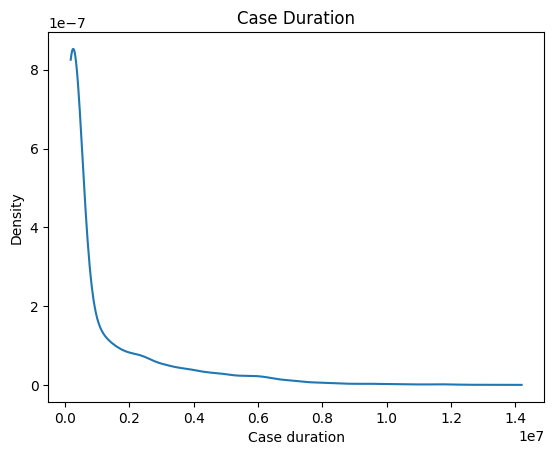

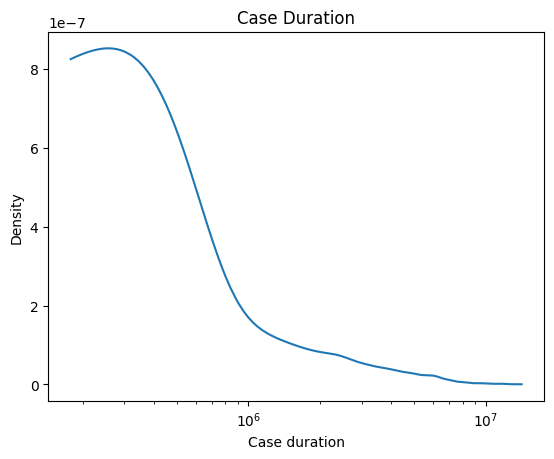

In [8]:
# your code
from pm4py.algo.transformation.log_to_interval_tree import algorithm as log_to_interval_tree
from pm4py.util import constants
from pm4py.statistics.traces.generic.log import case_statistics
x, y = case_statistics.get_kde_caseduration(reimburse_log, parameters={constants.PARAMETER_CONSTANT_TIMESTAMP_KEY: "time:timestamp"})

from pm4py.visualization.graphs import visualizer as graphs_visualizer

gviz = graphs_visualizer.apply_plot(x, y, variant=graphs_visualizer.Variants.CASES)
graphs_visualizer.view(gviz)

gviz = graphs_visualizer.apply_semilogx(x, y, variant=graphs_visualizer.Variants.CASES)
graphs_visualizer.view(gviz)

**Your answer**: *(Briefly describe the differences between the two models in about five sentences here.)*

### b) Discovery and Conformance Checking (9pts)

#### **b(i)** 
Mine a Petri net using Inductive Miner and display it.

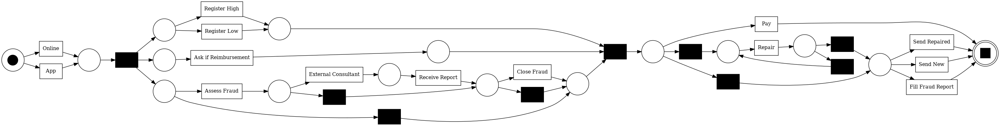

replaying log with TBR, completed variants ::   0%|          | 0/354 [00:00<?, ?it/s]

Petri net precision for the initial event log: 0.7815105372009773


In [9]:
# your code
net, im, fm = pm4py.discover_petri_net_inductive(reimburse_log)
pm4py.view_petri_net(net, im, fm, format='png') 
prec = pm4py.precision_token_based_replay(reimburse_log, net, im, fm)
print(f"Petri net precision for the initial event log: {prec}")

#### **b(ii)** 
Compute the fitness of the discovered Petri net using token-based replay.

*Hint: PM4Py can directly (using the top-level API) compute the number of missing, remaining, consumed, and produced tokens. Based on these, you can, for example, compute the token-based replay fitness.*

In [10]:
# your code
fitness = pm4py.fitness_token_based_replay(reimburse_log, net, im, fm)
print(f"Token-based replay fitness:\n{fitness}")

replaying log with TBR, completed variants ::   0%|          | 0/266 [00:00<?, ?it/s]

Token-based replay fitness:
{'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}


#### **b(iii)** 
Filter the log to contain only traces where *Register Low* occurs. How many traces does the resulting log `log_low` contain?


In [11]:
# your code
log_low = pm4py.filter_event_attribute_values(reimburse_log, "concept:name", ["Register Low"], level="case", retain=True)
print(f"Number of traces/cases: {len(log_low)}")

Number of traces/cases: 7021


#### **b(iv)** 
Discover a Petri net for `log_low` and compute its fitness. How does this model differ from the model you discovered in *b(i)*? 

Suppose each of your produced process models is considered a 2-class classifier: provided a trace, it returns "Yes" if and only if the trace can be replayed by the model. Based on this perspective, how would the two process models compare in terms of precision?

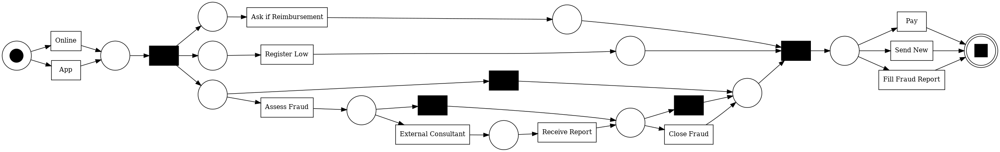

replaying log with TBR, completed variants ::   0%|          | 0/138 [00:00<?, ?it/s]

Petri net precision for log_low event log: 0.903962086213277


In [12]:
# your code
net_low, im_low, fm_low = pm4py.discover_petri_net_inductive(log_low)
pm4py.view_petri_net(net_low, im_low, fm_low, format='png') 
prec_low = pm4py.precision_token_based_replay(log_low, net_low, im_low, fm_low)
print(f"Petri net precision for log_low event log: {prec_low}")

**Your answer:** *(Briefly describe the difference between the two models here. About two sentences can be enough.*)

If we compare the second model to the first one, we can clearly observe that there's no longer the XOR choice (XOR gate) for the activities *Register Low* and *Register High*, because in the second model there's only the *Register Low* activity available due to the fact that we have filtered the initial log based on the *Register Low* activity at the trace level.

**Your answer**: *(Relate your observations to precision here.)*

In order to answer this question, we should refer to the concept of *precision* in this context. First, note that *fitness* measures to what extent the traces in an event log can be replayed correctly on the model. Therefore, if we can create a model that captures all behaviors in the event log, the fitness will be high. However, the other measure, i.e. *precision*, restricts the degrees of freedom for the traces that can be replayed on the petri net. This is because we want our petri net to capture the behavior of the traces in our event log rather than all the traces which can possibly exist. As a result, we expect the *precision* for the second model (the one obtained from the log_low event log) to be higher since it restricts what can be replayed upon the model. This is also confirmed by the *token-based replay precision* values that we have computed using the pm4py APIs.

### Conformance Diagnostics De-jure Model
The process owner provides you a de-jure model (i.e., a model of the should-be process) and a slightly changed version of the so far considered event log. 

In this task, you will again apply conformance checking by means of token-based replay to provide diagnostics on deviations.

#### **b(v)** 
Load the Petri net *pn_conf.apnml*, the event log *log_conf.xes*, and provide the overall (i.e., model-based) token-based replay fitness score.



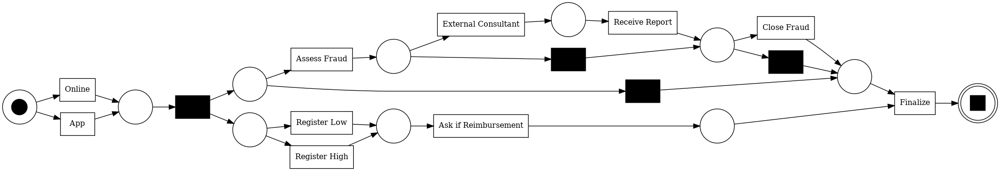

parsing log, completed traces ::   0%|          | 0/10000 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/122 [00:00<?, ?it/s]

Token-based replay fitness: {'perc_fit_traces': 91.01, 'average_trace_fitness': 0.9892081818181783, 'log_fitness': 0.9892890758104679, 'percentage_of_fitting_traces': 91.01}


In [13]:
# your code

# Load and view the Petri net
net_conf, im_conf, fm_conf = pm4py.read_pnml("./datasets/pn_conf.apnml")
pm4py.view_petri_net(net_conf, im_conf, fm_conf)

# Load the event log from the xes file
log_conf = pm4py.read_xes("./datasets/log_conf.xes")

# Compute the token-based replay fitness
fitness_conf = pm4py.fitness_token_based_replay(log_conf, net_conf, im_conf, fm_conf)
print(f"Token-based replay fitness: {fitness_conf}")

In [14]:
# Print out the places and inward arcs for the places (Used for later usage, when we want to see the number of different type of tokens for each place)
places = net_conf.places
transitions = net_conf.transitions
arcs = net_conf.arcs

for place in places:
    print(f"\nPlace: {place.name}")
    print("In Arcs:")
    for arc in place.in_arcs:
        print((arc.source.name, arc.source.label))


Place: n3
In Arcs:
('n14', 'External Consultant')

Place: n4
In Arcs:
('n15', 'Receive Report')
('n25', None)

Place: n6
In Arcs:

Place: n10
In Arcs:
('n24', None)
('n23', None)
('n17', 'Close Fraud')

Place: n11
In Arcs:
('n12', 'Ask if Reimbursement')

Place: n1
In Arcs:
('n22', 'Register High')
('n19', 'Register Low')

Place: n2
In Arcs:
('n21', None)

Place: n5
In Arcs:
('n16', 'Finalize')

Place: n7
In Arcs:
('n21', None)

Place: n8
In Arcs:
('n18', 'Online')
('n20', 'App')

Place: n9
In Arcs:
('n13', 'Assess Fraud')


#### **b(vi)** 
To provide additional diagnostics on the deviations, compute the missing, consumed, produced and remaining number of tokens for **each place**. 
To do so, use the following *pm4py* code:
    
    from pm4py.algo.conformance.tokenreplay import algorithm as token_based_replay
	tbr_results, place_fitness, transition_fitness, notexisting_activities_in_model =
    token_based_replay.apply(log_conf, net_conf, im_conf, fm_conf, parameters={"enable_pltr_fitness": True, "disable_variants": True})

After running this line for log `log_conf`, Petri net `net_conf` with initial marking `im_conf` and final marking `fm_conf`, the variable `place_fitness` will contain the token counts for each place and trace. Therefore, you will only need aggregate over the traces.
Print a table of the token counts per place. 


In [15]:
# your code
from pm4py.algo.conformance.tokenreplay import algorithm as token_based_replay
tbr_results, place_fitness, transition_fitness, notexisting_activities_in_model = token_based_replay.apply(log_conf, net_conf, im_conf, fm_conf, parameters={"enable_pltr_fitness": True, "disable_variants": True})

replaying log with TBR, completed variants ::   0%|          | 0/10000 [00:00<?, ?it/s]

In [16]:
token_types = ['m', 'r', 'c', 'p']
places = list(place_fitness.keys())
values = list(place_fitness.values())
place_token_records = {
    'places': places
}

# Save number of different token types for each place
for token_type in token_types:
    place_token_records[token_type] = list(map(lambda token_record: token_record[token_type], values))

place_token_df = pd.DataFrame(data=place_token_records)
display(place_token_df)

,places,m,r,c,p
0,n3,0,0,99,99
1,n4,0,0,1917,1917
2,n6,0,0,10000,10000
3,n10,0,0,10000,10000
4,n11,0,0,10000,10000
5,n1,899,899,10000,10000
6,n2,0,0,10000,10000
7,n5,0,0,10000,10000
8,n7,0,0,10000,10000
9,n8,0,0,10000,10000


#### **b(vii)** 
Consider the token counts per place and a few unfitting traces, which deviation(s) do you observe? Describe the deviation and briefly explain how it can be related to the token counts of the individual places. For example, activity *xy* is often missing resulting in a high number of missing tokens in place *p*.  


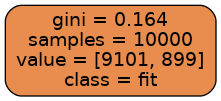

Number of unfit traces: 899
Transitions causing problem: {(n12, 'Ask if Reimbursement')}


In [17]:
# your code
string_attributes = ["concept:name"]
numeric_attributes = []
parameters = {"string_attributes": string_attributes, "numeric_attributes": numeric_attributes}
from functools import reduce
# Root cause analysis on the transitions that are executed in an unfit way
from pm4py.algo.conformance.tokenreplay.diagnostics import root_cause_analysis
trans_root_cause = root_cause_analysis.diagnose_from_trans_fitness(log_conf, transition_fitness, parameters=parameters)
from pm4py.visualization.decisiontree import visualizer as dt_vis
for trans in trans_root_cause:
        clf = trans_root_cause[trans]["clf"]
        feature_names = trans_root_cause[trans]["feature_names"]
        classes = trans_root_cause[trans]["classes"]
        # visualization could be called
        gviz = dt_vis.apply(clf, feature_names, classes)
        dt_vis.view(gviz)


# Root cause analysis on activities that are executed but are not in the process model
act_root_cause = root_cause_analysis.diagnose_from_notexisting_activities(log_conf, notexisting_activities_in_model,
                                                          parameters=parameters)
for act in act_root_cause:
    clf = act_root_cause[act]["clf"]
    feature_names = act_root_cause[act]["feature_names"]
    classes = act_root_cause[act]["classes"]
    # visualization could be called
    gviz = dt_vis.apply(clf, feature_names, classes)
    dt_vis.view(gviz)
    
unfit_traces = list(filter(lambda record: not record['trace_is_fit'], tbr_results))
unique_unfit_transitions = set(reduce(lambda trans1, trans2: trans1 + trans2, map(lambda record: record['transitions_with_problems'], unfit_traces)))

print(f"Number of unfit traces: {len(unfit_traces)}")
print(f"Transitions causing problem: {unique_unfit_transitions}")

**Your answer:** *(Describe the deviation(s). One sentence can already be enough.)*

By performing root cause analysis using the results obtained from the token-based replay, we can see the activity *Ask if Reimbursement* is missing in some of the traces.

**Your answer:** (*Relate the deviation(s) to the token counts of the individual places. Roughly five sentences can be enough for a precise description.*)

### c) Analyzing Fraud (4pts)

#### **c(i)** 
Filter the event log so that it only contains traces where a fraud report is filled (occurrence of `Fill Fraud Report`). For theses traces, create a bar plot showing the number of products of a certain brand involved in the fraud. Describe the resulting plot.

*Hint: Each case is associated with precisely one brand.*


In [18]:
# your code
fraud_report_log = pm4py.filter_event_attribute_values(reimburse_log, "concept:name", ["Fill Fraud Report"], level="case", retain=True)
brands = []

# For every case/trace, we should consider only one event to get the brand
for trace in fraud_report_log:
    for event in trace:
        brands.append(event['Brand'])
        break

brand_df = pd.DataFrame({'Brand': brands})
sns.countplot(x=brand_df['Brand']);

**Your answer:** (*Describe the plot in two to three sentences.*)

### Brief Explanation
First of all, we need to find the traces which include *Fill Fraud Report* event. This can be done by traversing the event log and looking for events within the traces which correspond to this activity. Next, for each trace/case, we consider only one event to find the brand for which fraud has been reported. Finally, we count the number of occurrences of each brand and display the results in the barplot.

### Description of the Plot
The barplot indicates that the brand **PEAR** has the highest number of fraud reports. The brand **CP** comes in the second place, and finally the brand **SKP** comes in the last place. So we can conclude, by the information we have at hand, that the brand **PEAR** is more fraudulent and the brand **SKP** is the least fraudulent among the brands that exist in our dataset.

#### **c(ii)**  
The plot shows differences between brands. Discuss the result. Consider what you learned in Lecture 11 (association rules). Try to provide additional analysis results to underpin your discussion.

*Hint: A very short additional analysis (i.e., a few lines of code) might already be sufficient.*


### Considerations / Inquiries
What should be the itemsets exactly?

In [66]:
# your code (for a short additional analysis)

from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules as arule

# Goal: Check what activities lead to fraud report

# Convert frad log to df
fraud_report_df = pm4py.convert_to_dataframe(fraud_report_log)
case_activities_df = pd.DataFrame(fraud_report_df.groupby('CaseId')['Activity'].apply(lambda s: s.unique()))
# obtain boolean matrix using TransactionEncoder() on the column of itemsets
itemsets_data = case_activities_df['Activity'].tolist()
te = TransactionEncoder()
boolean_matrix = te.fit(itemsets_data).transform(itemsets_data)
# create new dataframe such that the names of the products appear as column names
boolean_df = pd.DataFrame(boolean_matrix, columns = te.columns_)

frequent_itemsets = apriori(boolean_df, min_support=0.5, use_colnames=True)

assoc_rules_conf = arule(frequent_itemsets, metric = 'confidence', min_threshold = 0.8)

assoc_rules_conf.loc[assoc_rules_conf.apply(lambda x: len(x.consequents) == 1 and 'Fill Fraud Report' in x.consequents, axis=1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
2,(Ask if Reimbursement),(Fill Fraud Report),1.000000,1.0,1.000000,1.0,1.0,0.0,inf
6,(Assess Fraud),(Fill Fraud Report),1.000000,1.0,1.000000,1.0,1.0,0.0,inf
10,(Online),(Fill Fraud Report),0.666667,1.0,0.666667,1.0,1.0,0.0,inf
11,(Register Low),(Fill Fraud Report),0.627119,1.0,0.627119,1.0,1.0,0.0,inf
12,"(Ask if Reimbursement, Assess Fraud)",(Fill Fraud Report),1.000000,1.0,1.000000,1.0,1.0,0.0,inf
24,"(Ask if Reimbursement, Online)",(Fill Fraud Report),0.666667,1.0,0.666667,1.0,1.0,0.0,inf
27,"(Ask if Reimbursement, Register Low)",(Fill Fraud Report),0.627119,1.0,0.627119,1.0,1.0,0.0,inf
30,"(Assess Fraud, Online)",(Fill Fraud Report),0.666667,1.0,0.666667,1.0,1.0,0.0,inf
33,"(Assess Fraud, Register Low)",(Fill Fraud Report),0.627119,1.0,0.627119,1.0,1.0,0.0,inf
36,"(Ask if Reimbursement, Assess Fraud, Online)",(Fill Fraud Report),0.666667,1.0,0.666667,1.0,1.0,0.0,inf


**Your answer:** *(Relate your results to Lecture 11, approximately one short paragraph)*

## Question 6 - Simpson's Paradox (3 pts)

### Sex Bias in Berkeley Graduate Admissions?

In the Fall of 1973, the University of California at Berkeley released data about their graduate class. The data showed the major the applicant applied to, their self-reported gender (Male or Female), and whether or not they were accepted or rejected. The acceptance rates between men and women were different. This caused immediate concern in the public as people thought that Berkeley was biased against women.

The "Berkeley Dataset" contains all 12,763 applicants to UC-Berkeley's graduate programs in Fall 1973. This dataset was published by UC-Berkeley researchers in an analysis to understand the possible gender bias in admissions.

Dataset Variables:

Year : number ➜ The application year (this value is always 1973)

Major : string ➜: An anonymized major code (either A, B, C, D, E, F, or Other). The specific majors are unknown except that A-F are the six majors with the most applicants in Fall 1973

Gender : string ➜ Applicant self-reported gender (either M or F)

Admission: string ➜ Admission decision (either Rejected or Accepted)

**a)**
Upload the data from the `berkeley.csv` file and load it into a dataframe named `data`. Display the first few lines from the dataframe.

In [314]:
# your code
data = pd.read_csv('./datasets/berkeley.csv')
data.head()

,Year,Major,Gender,Admission
0,1973,C,F,Rejected
1,1973,B,M,Accepted
2,1973,Other,F,Accepted
3,1973,Other,M,Accepted
4,1973,Other,M,Rejected


**b)** Remove the "Year" column as it does not contain any information in this dataset (all years are 1973.)

In [315]:
# your code
data.drop(columns=['Year'], inplace=True)
data.head()

,Major,Gender,Admission
0,C,F,Rejected
1,B,M,Accepted
2,Other,F,Accepted
3,Other,M,Accepted
4,Other,M,Rejected


**c)** For each of the values of column "Gender", compute the admission rate and compare them against each other.

In [330]:
# your code
table_aggregated = pd.pivot_table(data=data,index=['Gender'], columns=['Admission'], aggfunc='count')
"""
Alternative Method
"""
# agg_data = data.groupby(by=['Gender', 'Admission']).agg('count')
# display(agg_data)

display(table_aggregated)

female_admission_rate = table_aggregated.values[0][0] / table_aggregated.iloc[0].sum()
male_admission_rate = table_aggregated.values[1][0] / table_aggregated.iloc[1].sum()

admission_rates = list(map(lambda values: values[0] / (values[0] + values[1]), table_aggregated.values))
table_aggregated['Rate'] = admission_rates
display(table_aggregated)

print(f"Female admission rate: {female_admission_rate}")
print(f"Male admission rate: {male_admission_rate}")

Major         
Admission Accepted Rejected
Gender                     
F             1494     2827
M             3738     4704

Major               Rate
Admission Accepted Rejected          
Gender                               
F             1494     2827  0.345753
M             3738     4704  0.442786

Female admission rate: 0.3457532978477204
Male admission rate: 0.4427860696517413


**Your answer:**

**d)** For each value combination of the "Gender" and "Major" columns, compute the admission rate. Compare the admission rate of women against the admission rate of men for each of the majors.

In [360]:
# your code

male_population = len(data[data['Gender'] == 'M'])
female_population = len(data[data['Gender'] == 'F'])
female_population_ratio = female_population / (female_population + male_population)
print(f"Female population ratio in the dataset: {female_population_ratio}")

table_by_major = pd.pivot_table(data=data,index=['Gender', 'Major'], columns=['Admission'], aggfunc={'Admission': 'count'})
display(table_by_major)

# Calculate the admission rates of females and males for different majors
admission_rates = list(map(lambda values: values[0] / (values[0] + values[1]), table_by_major.values))
table_by_major['Rate'] = admission_rates
print("Admission rates for different majors and genders")
display(table_by_major)

# Overall admission rates for different majors
admission_rate_by_major = pd.pivot_table(data=data,index=['Major'], columns=['Admission'], aggfunc={'Admission': 'count'})
admission_rates = list(map(lambda values: values[0] / (values[0] + values[1]), admission_rate_by_major.values))
admission_rate_by_major['Rate'] = admission_rates
print("Overall admission rates for different majors")
display(admission_rate_by_major)


gender_ratio = data.groupby(by=['Major', 'Gender']).agg('count')
gender_ratio_reshaped = gender_ratio.values.reshape(-1, 2)
register_rate = list(map(lambda values: (round(values[0] / (values[0] + values[1]) * 100, 2), round(values[1] / (values[0] + values[1]) * 100, 2)), gender_ratio_reshaped))
gender_ratio['Percentage'] = np.array(register_rate).reshape(-1)
print("Ratio of registered students for each major")
display(gender_ratio)

Female population ratio in the dataset: 0.3385567656507091


Admission         
Admission     Accepted Rejected
Gender Major                   
F      A            89       19
       B            17        8
       C           201      392
       D           131      244
       E            94      299
       F            25      316
       Other       937     1549
M      A           825      313
       B           353      207
       C           120      205
       D           138      279
       E            53      138
       F            22      351
       Other      2227     3211

Admission rates for different majors and genders


Admission               Rate
Admission     Accepted Rejected          
Gender Major                             
F      A            89       19  0.824074
       B            17        8  0.680000
       C           201      392  0.338954
       D           131      244  0.349333
       E            94      299  0.239186
       F            25      316  0.073314
       Other       937     1549  0.376911
M      A           825      313  0.724956
       B           353      207  0.630357
       C           120      205  0.369231
       D           138      279  0.330935
       E            53      138  0.277487
       F            22      351  0.058981
       Other      2227     3211  0.409526

Overall admission rates for different majors


Admission               Rate
Admission  Accepted Rejected          
Major                                 
A               914      332  0.733547
B               370      215  0.632479
C               321      597  0.349673
D               269      523  0.339646
E               147      437  0.251712
F                47      667  0.065826
Other          3164     4760  0.399293

Ratio of registered students for each major


Admission  Percentage
Major Gender                       
A     F             108        8.67
      M            1138       91.33
B     F              25        4.27
      M             560       95.73
C     F             593       64.60
      M             325       35.40
D     F             375       47.35
      M             417       52.65
E     F             393       67.29
      M             191       32.71
F     F             341       47.76
      M             373       52.24
Other F            2486       31.37
      M            5438       68.63

In [342]:
f = data[data['Gender'] == 'F']
m = data[data['Gender'] == 'M']
len(f) / (len(m) + len(f))

0.3385567656507091

**Your answer:**

By analyzing the dataset and comparing the results, we can see that in certain majors, females students have higher admission rates compared to males students. For instance, female students have an admission rate of 82.4% in major A, which is higher than 72.5% for male students. Besides, female students also have a higher admission rate in major B (68%) compared to male students (63%). Note that these are the two majors which have the highest admission rate in total (with major A having 73.35% and major B having a 63.25% overall admission rate). However, the number of female students registered in these majors is quite lower than the registered male students (108 female students are registered in major A, whereas 1138 male students are registered in major A. Also, only 25 female students are registered in major B, whereas 560 male students are registered in major B.). Major F is the third major with the highest overall admission rate, in which male students seem to have better results and a higher number of registered students compared to females. Thus, we see that the number of female students registered in majors with high overall admission rates is lower than the number of male students registered in these majors. In other words, female students are mostly registered in the majors which have lower overall admission rates. Note that we have taken into account the population ratio of females in the wholse dataset, which is approximately 0.34, i.e., only 34 percent of the instances are related to female students.

**e)** Can you confirm there is a sex bias in the admission rates of the students?

**Your answer:**

If we take into account the relative population of female students in the whole dataset, we see that female students are mostly registered in majors which have lower overall admission rates. Therefore, we can not conclude that there exists a sex bias in the admission rates of students.

## Question 7: Big Data (15pts)

In [3]:
import pandas as pd

You are a data scientist at NASA, an agency for civil space programs, and with your team you develop and maintain the software of the NASA Crew Exploration Vehicle (CEV).  Your task is to analyze the performance of the software, and as a first exploratory step, you would like to **compute the mean execution times** of function calls within that software. Since the running vehicle will generate a high throughput of observable events in a stream, you decide to set up a MapReduce pipeline in Hadoop. 

The file **nasa-cev-software-tests.tsv** records timestamped events of the vehicle's software tests. The log contains the columns *Case*, *Activity* and *Timestamp*, denoting the case ID, the activity key (method call) and timestamp of the event record in nanoseconds, respectively. Furthermore, the log contains the columns *Lifecycle Transition* and *Execution ID*. The lifecycle transition takes either of the values *start* and *complete*, stating whether the corresponding activity (method call) in that row is being started or completed at the specified timestamp. The execution ID relates each event to a concrete method call, i.e., for each execution ID, there are exactly two entries (namely a *start* and a *complete* event) in the log.

### a) Plan the Maths (2pt):

The mean $\mu_n$ over numerical values $v_1,...,v_n$ is well-known to be computed as $\mu_n = \frac{1}{n}\sum_{i=1}^{n} v_i$.\
One may also use the alternative recursive formalization $\mu_{n+m} = \frac{n\cdot\mu_{n} + m\cdot\mu_{m}}{n+m}$. \
What is the advantage of using the alternative formalization when you think of handling streaming data or distributed data? Briefly explain.


**Your answer:**

In the first case, we need to have all the data available in order to compute the mean value. However, the second formalization allows us to compute the mean value while batches of data are being streamed. Therefore, the alternative formalization is more suitable when we are dealing with streaming or distributed data.

### b) Set up MapReduce (10pts)

Realize the computation of the mean execution times of activities as a MapReduce job. 
You need to implement this a cascaded MapReduced job. This means that the output of the first job will serve as the input of the second job. In the first job, derive the execution times of each activity execution, i.e. the time difference between the *complete* and the *start* lifecycle transition of each activity execution. In the second step, aggregate this timing information to compute the mean.

#### **b(i)** 
Specify the *function signatures* of the map functions and the reduce functions that you are going to use.\
I.e., find concrete sets to substitute $K_1, V_1, ... $ in the general signatures for map and reduce functions \

$ map:  K_1 \times V_1 \rightarrow (K_2 \times V_2)^* $\
$ reduce: K_2 \times (V_2)^* \rightarrow (V_3)^*$ (or a singleton $V_3$) 

*Hint: You may introduce symbols to denote sets, e.g. $Act$ for the set of activities.\
You may also first implement the solution (b(ii)) to get an idea about the underlying signatures.\
Mind that you need two map and two reduce functions.*

**Your answer:**

#### **b(ii)**: 
Specify map functions and reduce functions to compute the mean execution time per activity as python scripts.

In [1]:
# your code (nasa_mapper1.py)
import sys

for line in sys.stdin:
    line = line.strip()
    activity, timestamp, lifecycle_trans, exec_id = line.split("\t")
    print(f"{exec_id}\t{activity}\t{timestamp}")

In [ ]:
# your code (nasa_reducer1.py)
import sys

current_exec_id = None
current_timestamp = 0
current_activity = 0
exec_id = None

# input comes from STDIN
for line in sys.stdin:
    # remove leading and trailing whitespace
    line = line.strip()

    # parse the input we got from mapper.py
    exec_id, activity, timestamp = line.split('\t')

    # convert count (currently a string) to int
    try:
        timestamp = int(timestamp)
    except ValueError:
        # count was not a number, so silently
        # ignore/discard this line
        continue

    # this IF-switch only works because Hadoop sorts map output
    # by key (here: word) before it is passed to the reducer
    if current_exec_id == exec_id:
        current_timestamp = abs(current_timestamp - timestamp)
        current_activity = activity
    else:
        if current_exec_id:
            # write result to STDOUT
            print(f'{current_exec_id}\t{current_activity}\t{current_timestamp}')
        current_timestamp = timestamp
        current_exec_id = exec_id
        current_activity = activity

# do not forget to output the last word if needed!
if current_exec_id == exec_id:
    print(f'{current_exec_id}\t{current_activity}\t{current_timestamp}')


In [13]:
# your code (nasa_mapper2.py)
import sys

for line in sys.stdin:
    line = line.strip()
    exec_id, activity, exec_time = line.split("\t")
    print(f"{activity}\t{exec_time}")

3

In [ ]:
# your code (nasa_reducer2.py)
import sys

current_activity = 0
current_mean = 0
current_total = 0
activity = None

# input comes from STDIN
for line in sys.stdin:
    # remove leading and trailing whitespace
    line = line.strip()

    # parse the input we got from mapper.py
    activity, exec_time = line.split('\t')

    # convert count (currently a string) to int
    try:
        timestamp = int(timestamp)
    except ValueError:
        # count was not a number, so silently
        # ignore/discard this line
        continue

    # this IF-switch only works because Hadoop sorts map output
    # by key (here: word) before it is passed to the reducer
    if current_activity == activity:
        current_mean = (current_total * current_mean + exec_time) / (current_total + 1)
        current_total += 1
        current_activity = activity
    else:
        if current_activity:
            # write result to STDOUT
            print(f'{current_activity}\t{current_mean}')
        current_mean = exec_time
        current_activity = activity
        current_total = 1

# do not forget to output the last word if needed!
if current_activity == activity:
    print(f'{current_activity}\t{current_mean}')


### c) Run MapReduce (3pts)

In the following, please use one of your team members' matriculation number as an identifier.

#### **c(i) (Randomization)**: 
Before applying your functions from the previous step to the dataset, please insert the matriculation number and run the following lines to randomly filter out a few of the traces in the event log, and continue working with the filtered log. 


In [34]:
# your matriculation number here
matr_nb = 441639

# utility code (do not change)
import random
random.seed(matr_nb)

full_df = pd.read_csv("datasets/nasa-cev-software-tests.tsv", sep="\t")

case_ids = list(set(full_df["Case"].values))
case_ids.sort()
filtered_out_case_ids = random.sample(case_ids, 10)
filtered_case_ids = [case_id for case_id in case_ids if case_id not in filtered_out_case_ids]
randomized_df = full_df[full_df["Case"].isin(filtered_case_ids)]

randomized_df.to_csv("datasets/nasa-cev-software-tests-randomized-" + str(matr_nb) + ".tsv",
          columns=["Activity", "Timestamp", "Lifecycle Transition", "Execution ID"],
          sep="\t", index=False, header=False)



In [54]:
exec_time_agg = randomized_df.groupby(by=['Execution ID', 'Activity']).apply(lambda x: abs(x['Timestamp'].values[0] - x['Timestamp'].values[1]))
display(agg1.groupby(by='Activity').agg('mean'))

Activity
cev.CEV()                                    317561.158059
cev.CEV.abortPassiveLAScompletion()          152890.384428
cev.CEV.completion()                         391443.044970
cev.CEV.deOrbit()                            283163.030864
cev.CEV.edsSeparation()                      163702.100145
cev.CEV.eiBurn(boolean,boolean)              387768.916129
cev.CEV.enterOrbitOps()                      152744.691489
cev.CEV.lasJettison()                        110595.261017
cev.CEV.loiBurn()                             10669.287263
cev.CEV.lsamAscentBurn()                      93006.510288
cev.CEV.lsamAscentRendezvous()               152628.968978
cev.CEV.lsamRendezvous()                     256408.111241
cev.CEV.lsamSeparation()                      96131.466667
cev.CEV.smSeparation()                       169927.214894
cev.CEV.srbIgnition()                         91622.011628
cev.CEV.stage1Separation()                   136499.826360
cev.CEV.stage2Separation()                    6

1#### **c(ii)**:
Now, it is time to work with the Hadoop Distributed File System (HDFS). Follow the instructions below and show your results in each step (screenshots of the command line).

    1) Import the event log to your Docker engine (at /usr/local/hadoop/(your_matr_nb)-event-log/). You also need to import the python scripts, but only document the event log import here.
    2) Upload the files to the running HDFS (at /input/(your_matr_nb)-event-log/).
	3) Run Hadoop commands for the MapReduce computation.
    4) Show the final output (computed mean execution times).

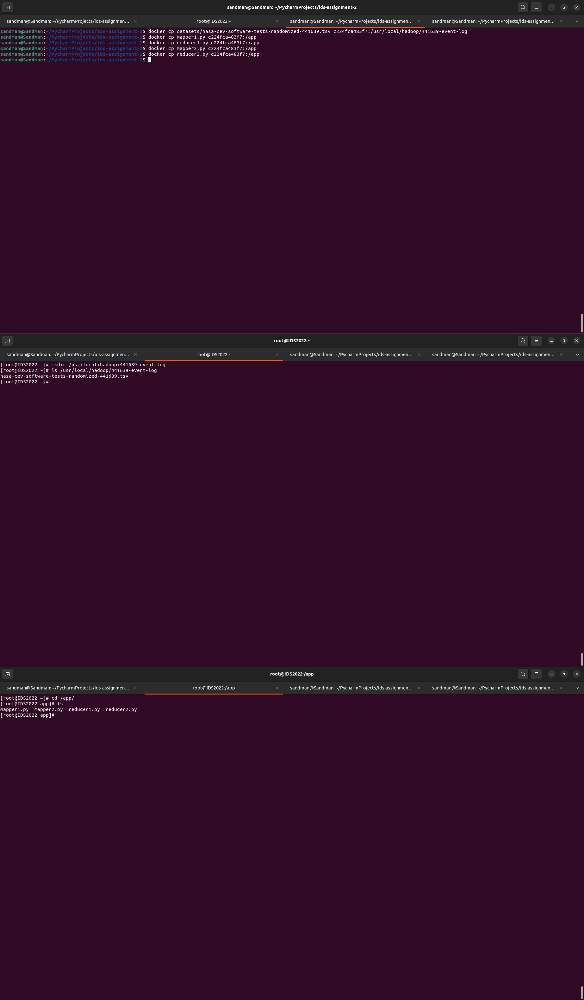

In [58]:
from IPython.display import Image
# your code
Image(filename='screenshots/part1_merged.jpg')

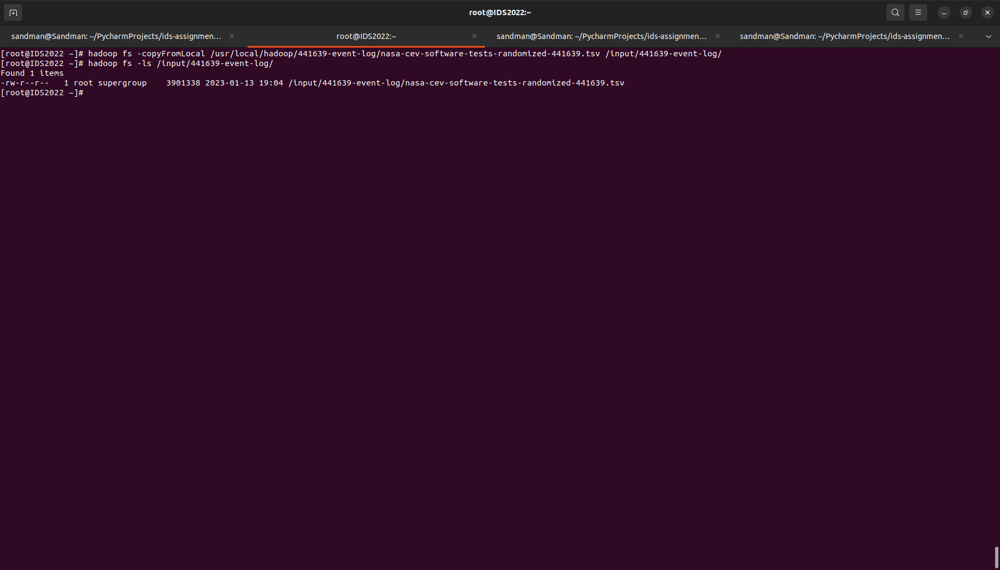

In [59]:
# your code
Image(filename='screenshots/part2.png')

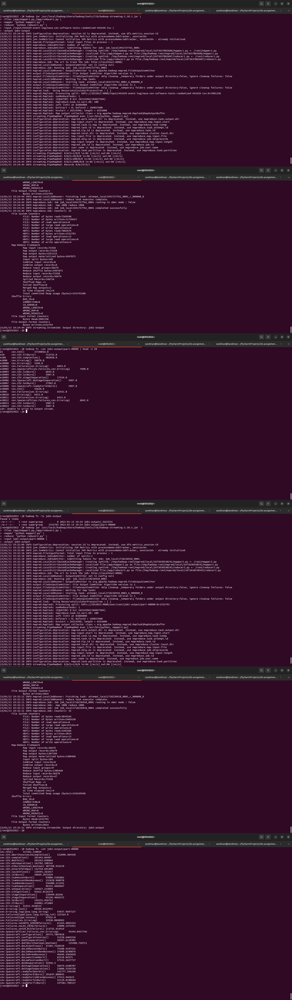

In [60]:
# your code
Image(filename='screenshots/part3.jpg')

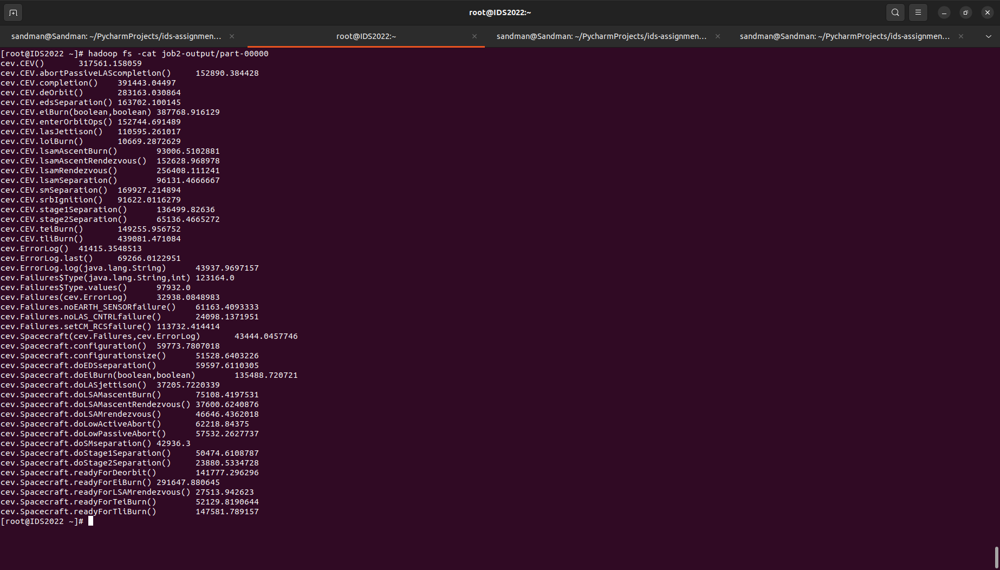

In [61]:
# your code
Image(filename='screenshots/part4.png')